In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from sklearn.metrics import roc_curve, roc_auc_score, auc
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.optim as optim
from sklearn.model_selection import KFold
from torch.utils.data import Subset
import torch
import copy
import json

import sys
sys.path.append('../')

import importlib
import mia
import utils
importlib.reload(mia)
importlib.reload(utils)

from utils import *
from mia import *
import yaml

In [7]:
k_values = list(range(0,144000,1000))

loss_columns = [f'loss_{k}' for k in k_values]

target_fpr = 0.01

CB_color_cycle = ['#377eb8', '#4daf4a','#f781bf',
                '#a65628','#ff7f00', '#984ea3',
                  '#999999', '#e41a1c', '#dede00']

## Wikipedia Pythia 6.9B (Pile-RS-Truncated)

In [2]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_wiki_pythia69b = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/wiki/pythia6-9b_processed/pile_reservoirv2_wiki_seqlen{seqlen}_pythia-6.9b_processed.pkl", "rb") as f:
        dataset_wiki_pythia69b[seqlen] = pd.read_pickle(f)


In [3]:
dataset_wiki_pythia69b["seq_len=64"] = dataset_wiki_pythia69b.pop(64)
dataset_wiki_pythia69b["seq_len=128"] = dataset_wiki_pythia69b.pop(128)
dataset_wiki_pythia69b["seq_len=256"] = dataset_wiki_pythia69b.pop(256)
dataset_wiki_pythia69b["seq_len=512"] = dataset_wiki_pythia69b.pop(512)
dataset_wiki_pythia69b["seq_len=1024"] = dataset_wiki_pythia69b.pop(1024)
dataset_wiki_pythia69b["seq_len=2048"] = dataset_wiki_pythia69b.pop(2048)

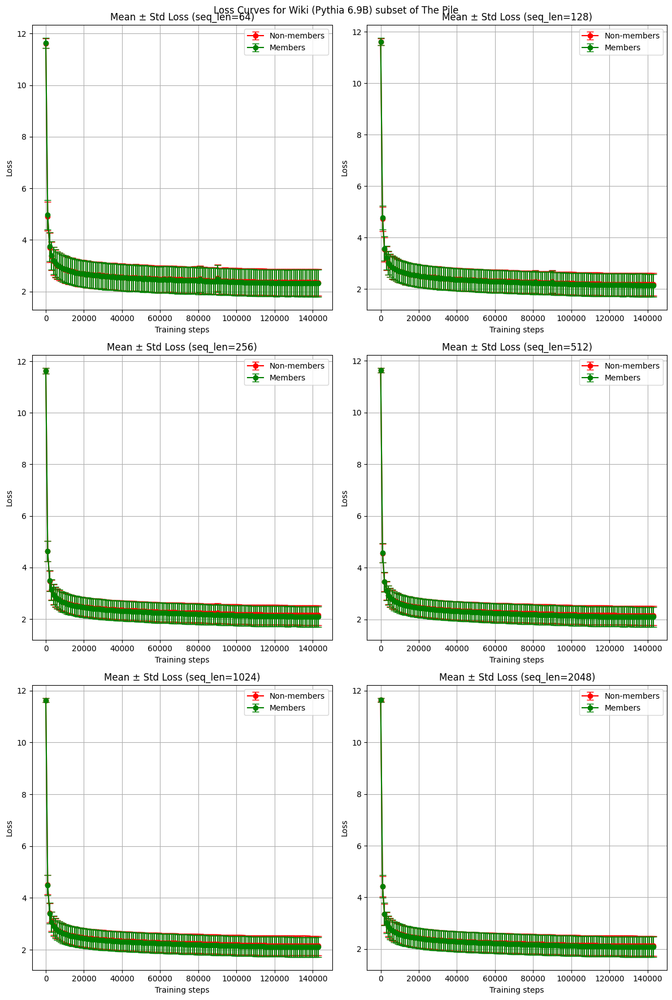

In [4]:
plot_loss_curves(dataset_wiki_pythia69b, "Wiki (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


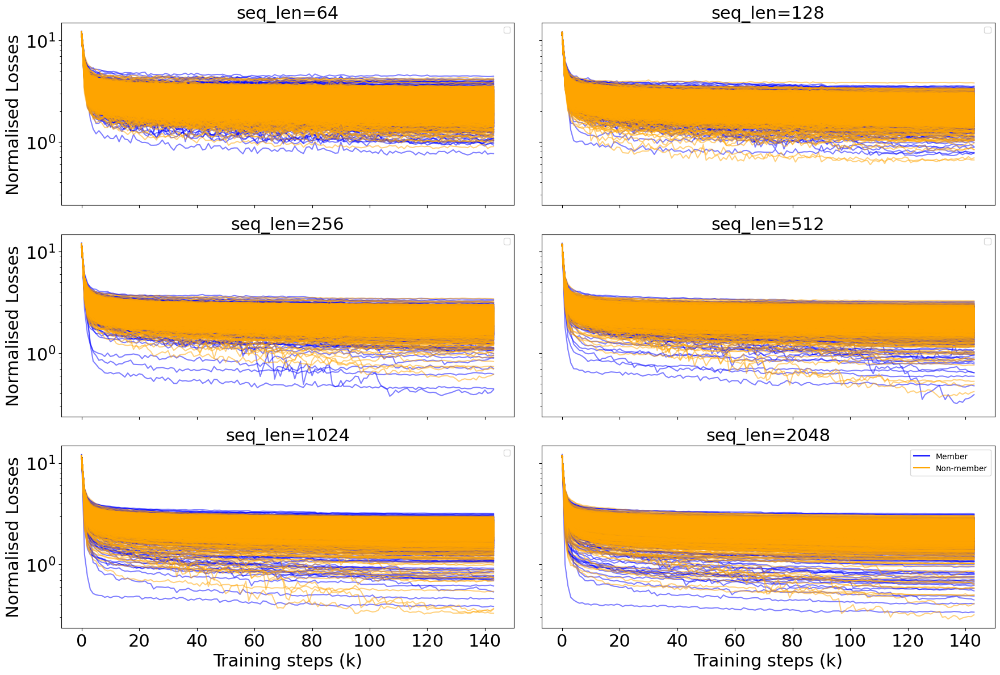

In [5]:
plot_indv_loss_curves(dataset_wiki_pythia69b, k_values, dataset_name="Wikipedia (Pythia 6.9B)")

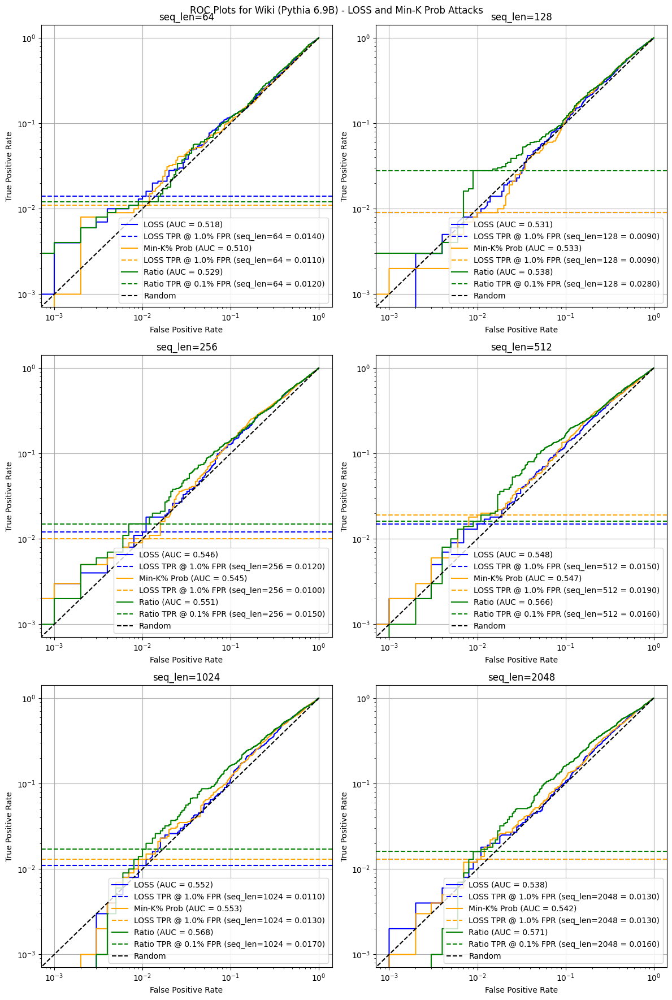

In [8]:
wiki_loss_aucs, wiki_loss_tpr_at_target, wiki_minkprob_aucs, wiki_minkprob_tpr_at_target, wiki_ratio_aucs, wiki_ratio_tpr_at_target = plot_roc_curves(dataset_wiki_pythia69b, "Wiki (Pythia 6.9B)", target_fpr)

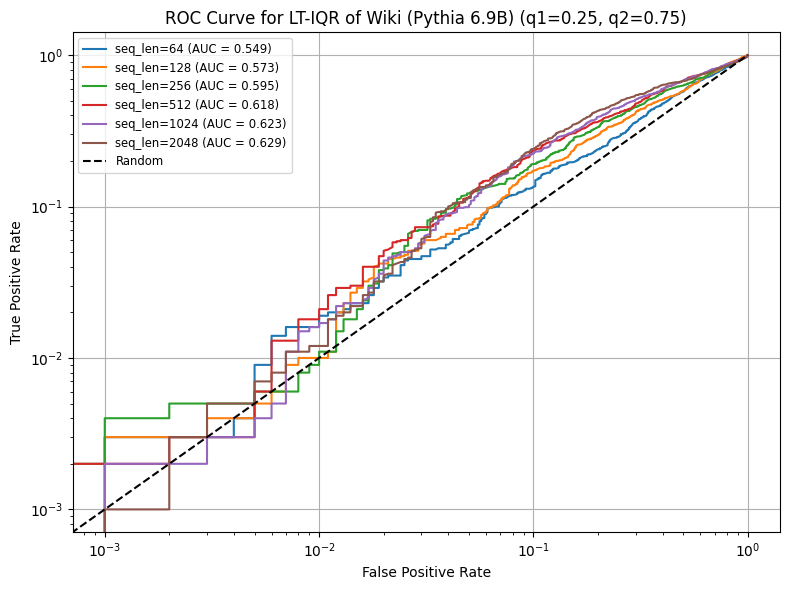

In [11]:
wiki_144_cp_aucs, wiki_144_cp_tpr = plot_roc_iqr_single_plot(dataset_wiki_pythia69b, loss_columns, "Wiki (Pythia 6.9B)", target_fpr, True)

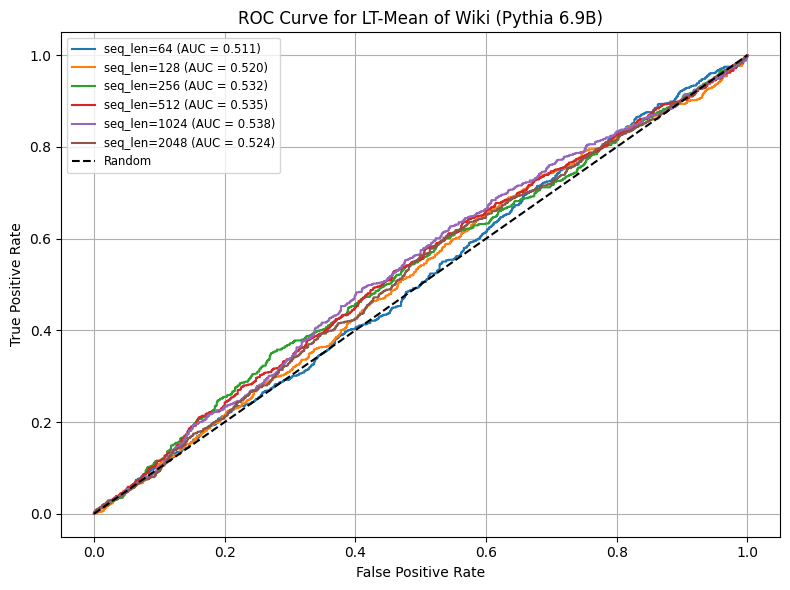

In [14]:
wiki_144_cp_mean_aucs, wiki_144_cp_mean_tprs = plot_loss_trace_mean(dataset_wiki_pythia69b, loss_columns, "Wiki (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmen

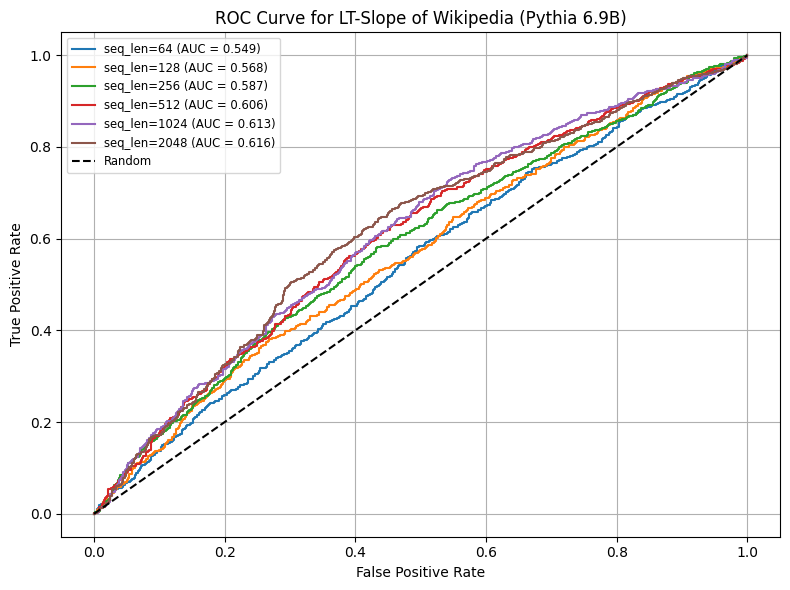

In [15]:
wiki_144_cp_slope_aucs, wiki_144_cp_slope_tpr = plot_loss_trace_slope(dataset_wiki_pythia69b, loss_columns, "Wikipedia (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

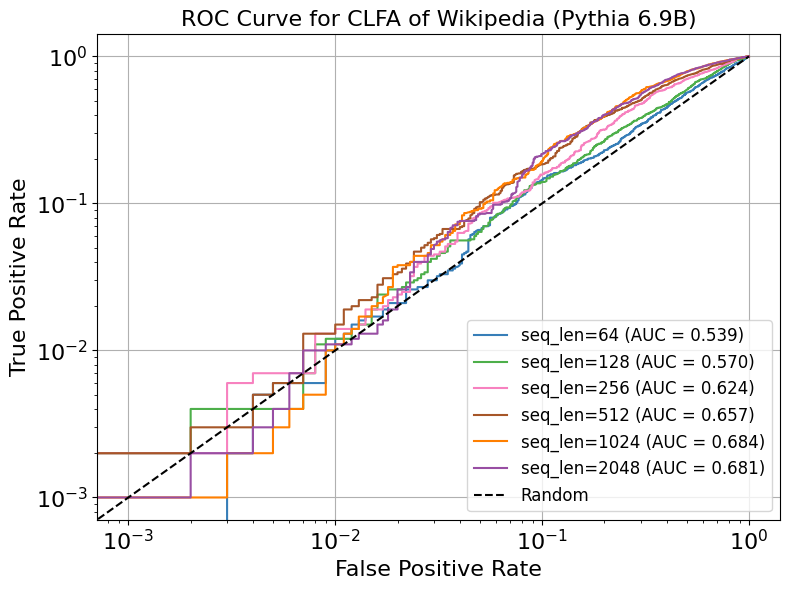

In [16]:
wiki_144_cp_clfa_aucs, wiki_144_cp_clfa_tprs = plot_clfa_normalized(dataset_wiki_pythia69b, loss_columns, "Wikipedia (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 

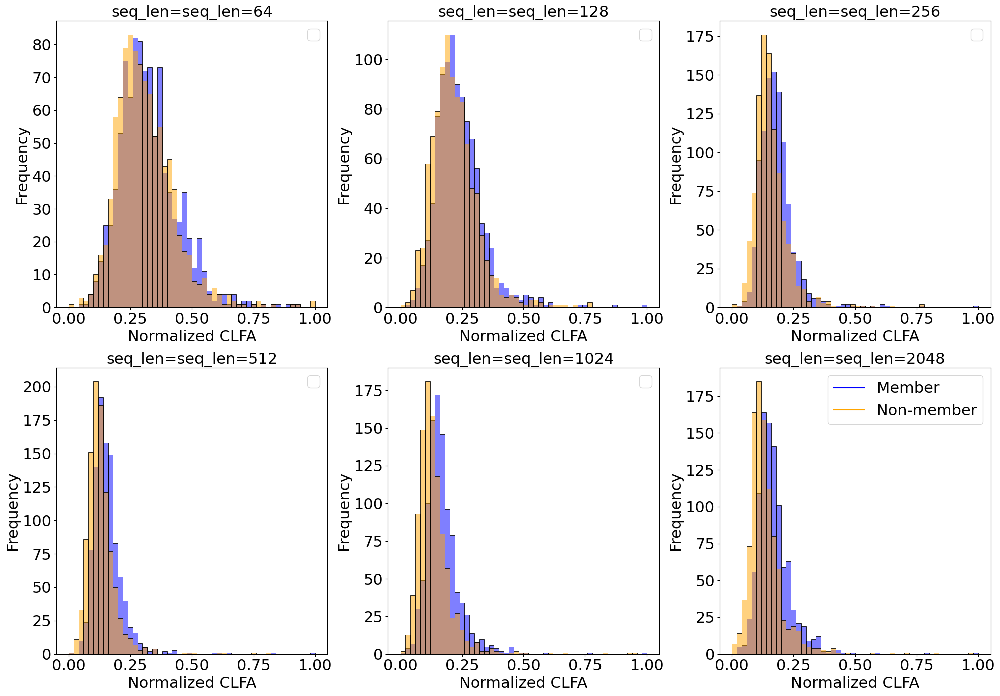

In [17]:
plot_clfa_norm_distribution(dataset_wiki_pythia69b, "Wiki (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  for i, (title, df) in enumerate(dataset_dict.items()):
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.p

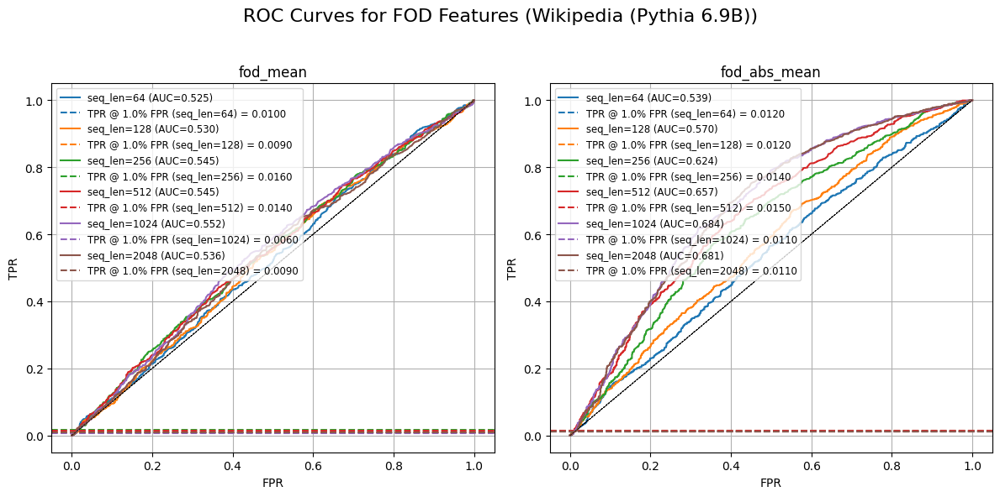

In [18]:
wiki_144_fod_mean, wiki_144_fod_mean_tpr, wiki_144_fod_abs_mean, wiki_144_fod_abs_mean_tpr = plot_fod(dataset_wiki_pythia69b, "Wikipedia (Pythia 6.9B)", loss_columns, target_fpr)

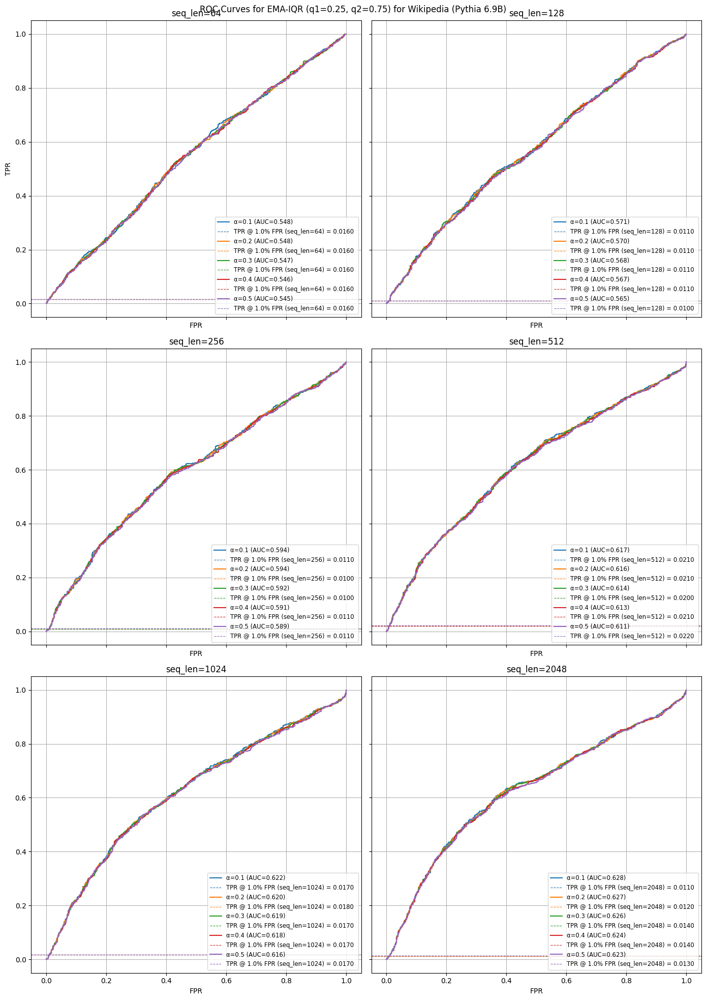

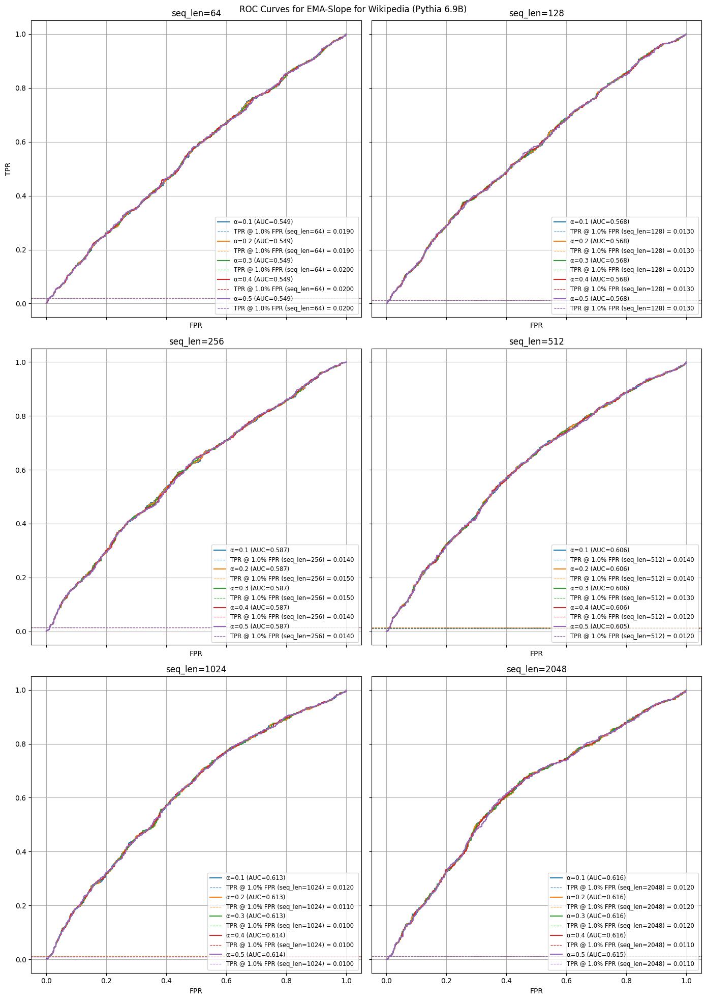

In [19]:
dataset_ema_wiki_144_pythia69b = {}
wiki_144_cp_ema_iqr_aucs, wiki_144_cp_ema_iqr_tprs, wiki_144_cp_ema_slope_aucs, wiki_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_wiki_pythia69b, dataset_ema_wiki_144_pythia69b, "Wikipedia (Pythia 6.9B)", loss_columns, target_fpr)

### Normalised Loss Traces (Wiki 6.9B)

In [21]:
dataset_wiki_pythia69b_normalised = normalize_loss_dfs(dataset_wiki_pythia69b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


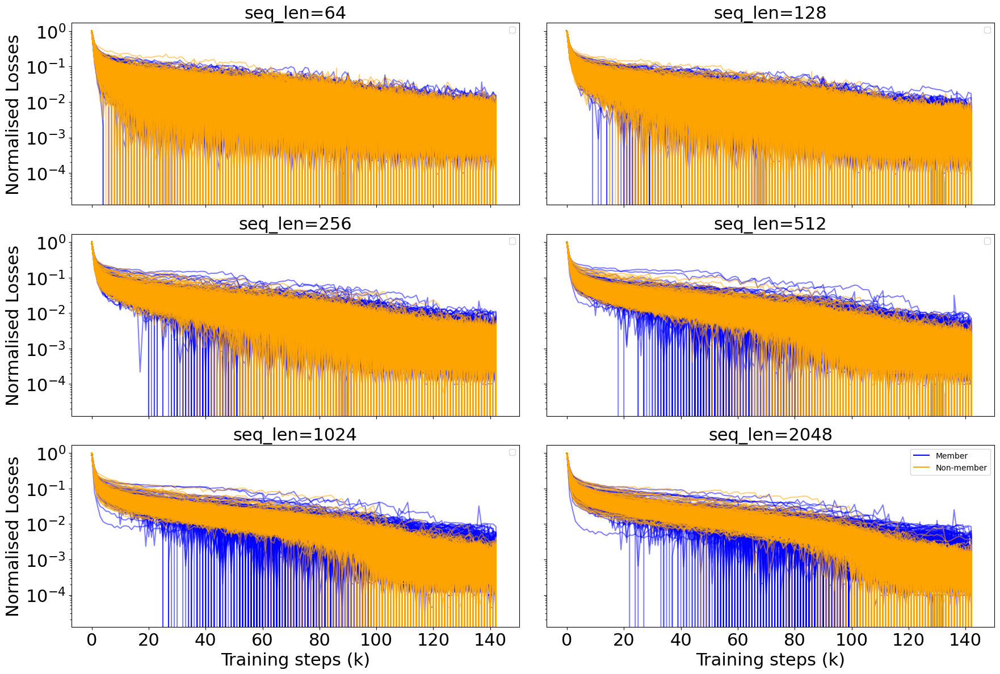

In [23]:
plot_indv_loss_curves(dataset_wiki_pythia69b_normalised, k_values, "Wiki Normalised Losses (Pythia 6.9B)")

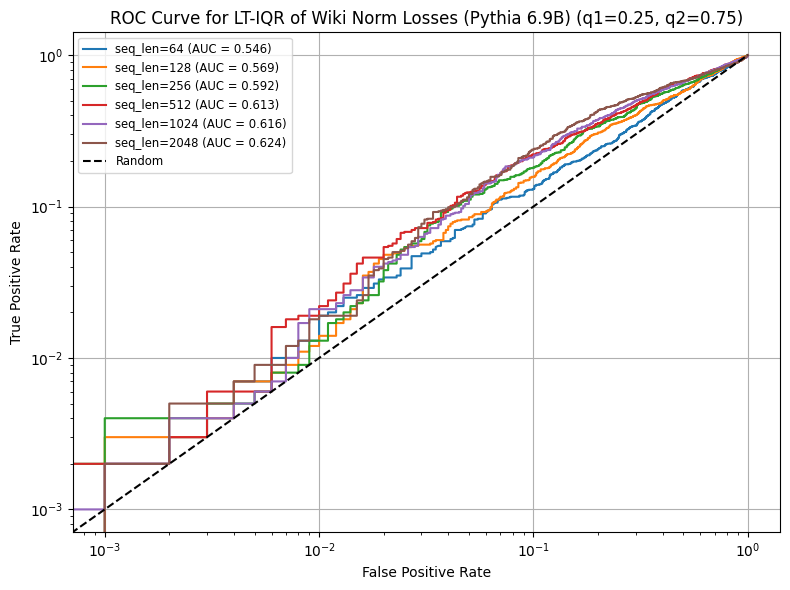

In [24]:
wiki_144_cp_norm_aucs, wiki_144_cp_norm_tpr = plot_roc_iqr_single_plot(dataset_wiki_pythia69b_normalised, loss_columns, "Wiki Norm Losses (Pythia 6.9B)", target_fpr, True)

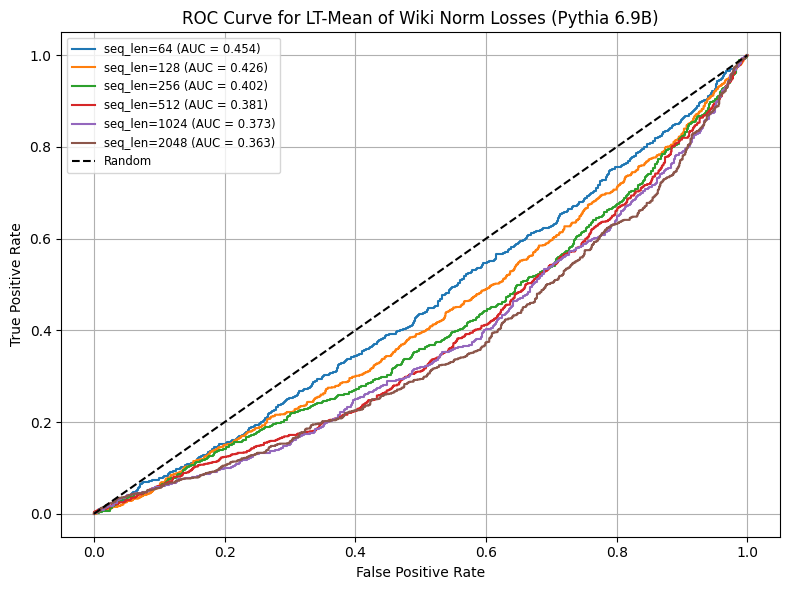

In [25]:
wiki_144_cp_norm_mean_aucs, wiki_144_cp_norm_mean_tprs = plot_loss_trace_mean(dataset_wiki_pythia69b_normalised, loss_columns, "Wiki Norm Losses (Pythia 6.9B)", target_fpr, True)

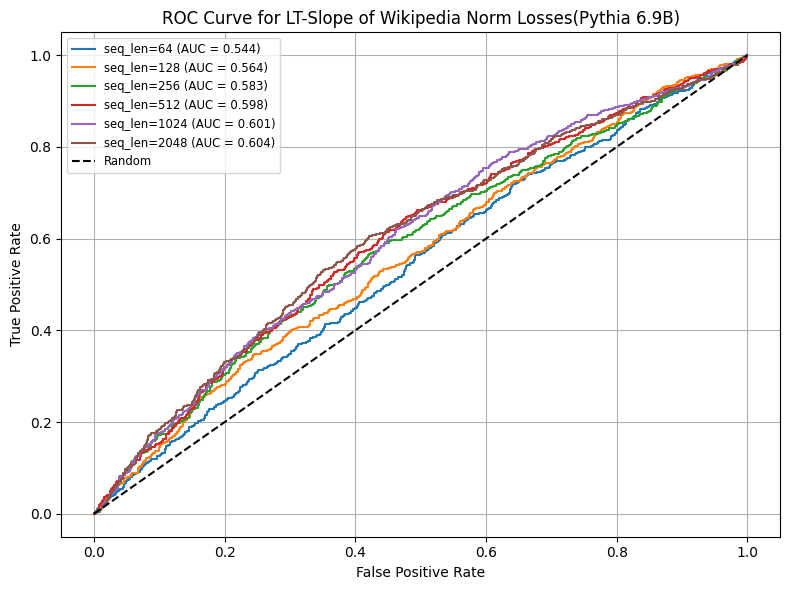

In [26]:
wiki_144_cp_norm_slope_aucs, wiki_144_cp_norm_slope_tpr = plot_loss_trace_slope(dataset_wiki_pythia69b_normalised, loss_columns, "Wikipedia Norm Losses(Pythia 6.9B)", target_fpr, True)

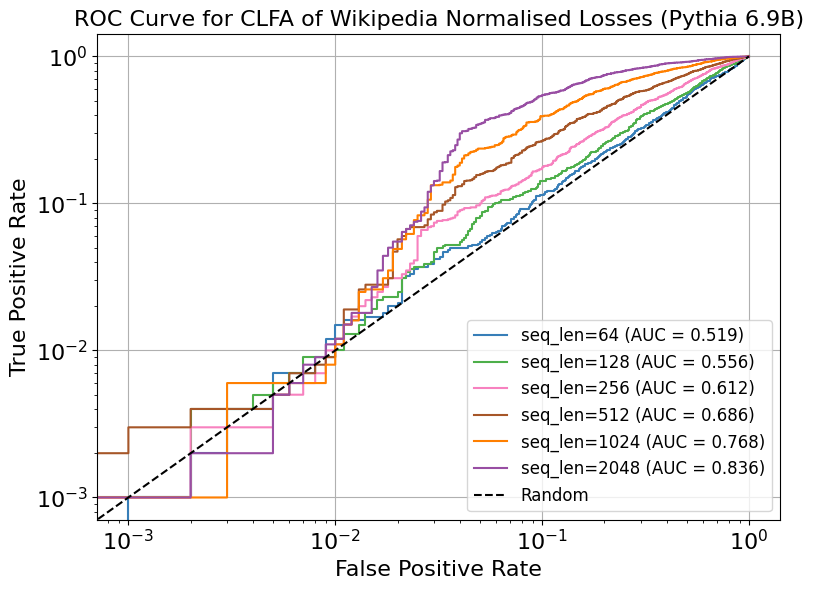

In [27]:
wiki_144_cp_norm_clfa_aucs, wiki_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_wiki_pythia69b_normalised, loss_columns, "Wikipedia Normalised Losses (Pythia 6.9B)", target_fpr, True)

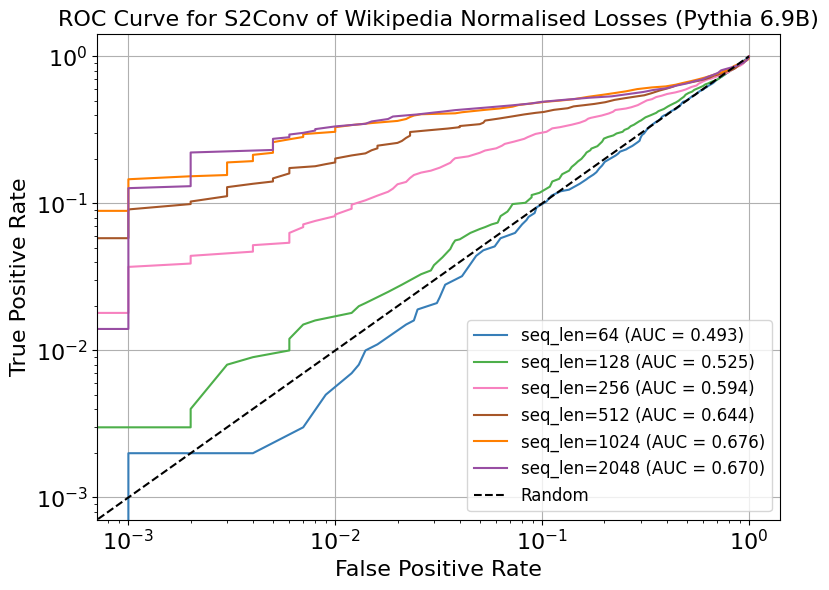

In [28]:
wiki_144_cp_norm_s2conv_aucs, wiki_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_wiki_pythia69b_normalised, loss_columns, "Wikipedia Normalised Losses (Pythia 6.9B)", target_fpr )

## PubMed Central Pythia 6.9B (Pile-RS-Truncated)

In [48]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_pubmedc_pythia69b = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/pubmedc/pythia6-9b_processed/pile_reservoirv2_pubmedc_seqlen{seqlen}_pythia-6.9b_processed.pkl", "rb") as f:
        dataset_pubmedc_pythia69b[seqlen] = pd.read_pickle(f)


In [49]:
dataset_pubmedc_pythia69b["seq_len=64"] = dataset_pubmedc_pythia69b.pop(64)
dataset_pubmedc_pythia69b["seq_len=128"] = dataset_pubmedc_pythia69b.pop(128)
dataset_pubmedc_pythia69b["seq_len=256"] = dataset_pubmedc_pythia69b.pop(256)
dataset_pubmedc_pythia69b["seq_len=512"] = dataset_pubmedc_pythia69b.pop(512)
dataset_pubmedc_pythia69b["seq_len=1024"] = dataset_pubmedc_pythia69b.pop(1024)
dataset_pubmedc_pythia69b["seq_len=2048"] = dataset_pubmedc_pythia69b.pop(2048)

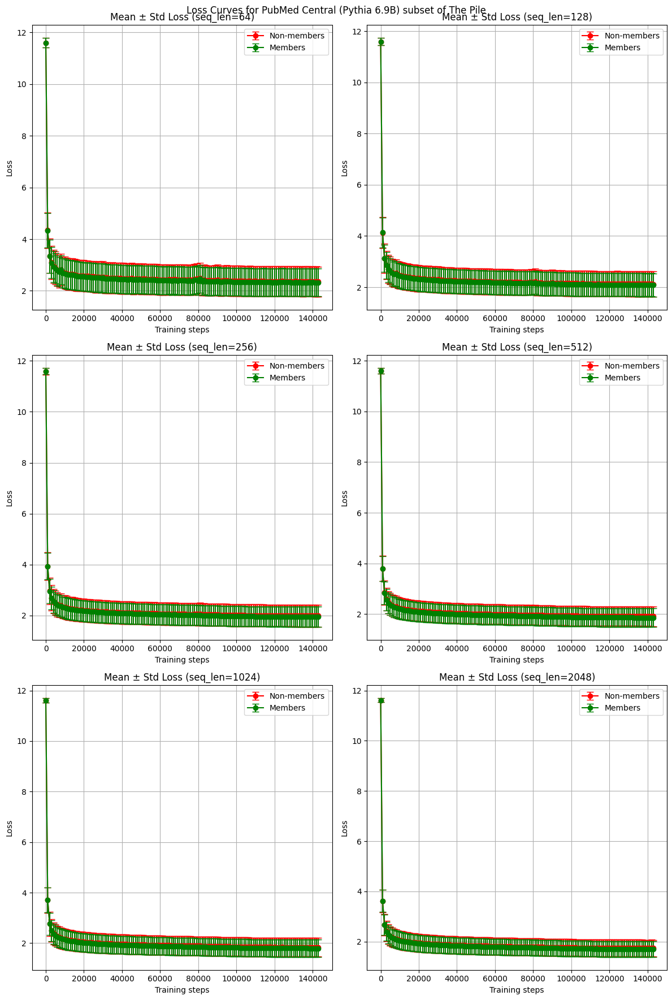

In [50]:
plot_loss_curves(dataset_pubmedc_pythia69b, "PubMed Central (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


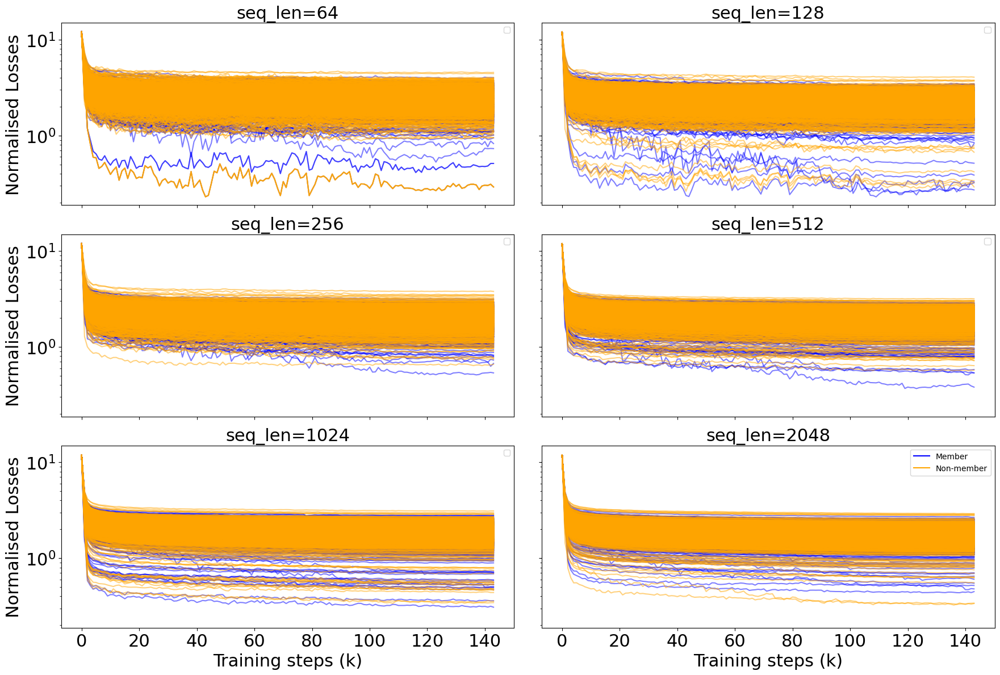

In [51]:
plot_indv_loss_curves(dataset_pubmedc_pythia69b, k_values, dataset_name="PubMed Central (Pythia 6.9B)")

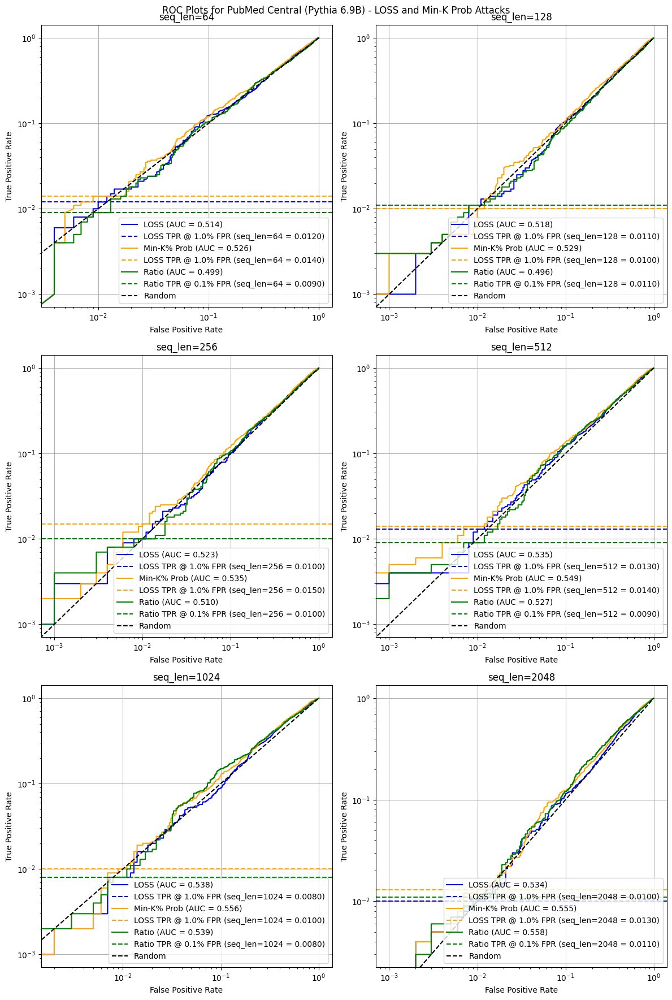

In [52]:
pubmedc_loss_aucs, pubmedc_loss_tpr_at_target, pubmedc_minkprob_aucs, pubmedc_minkprob_tpr_at_target, pubmedc_ratio_aucs, pubmedc_ratio_tpr_at_target = plot_roc_curves(dataset_pubmedc_pythia69b, "PubMed Central (Pythia 6.9B)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

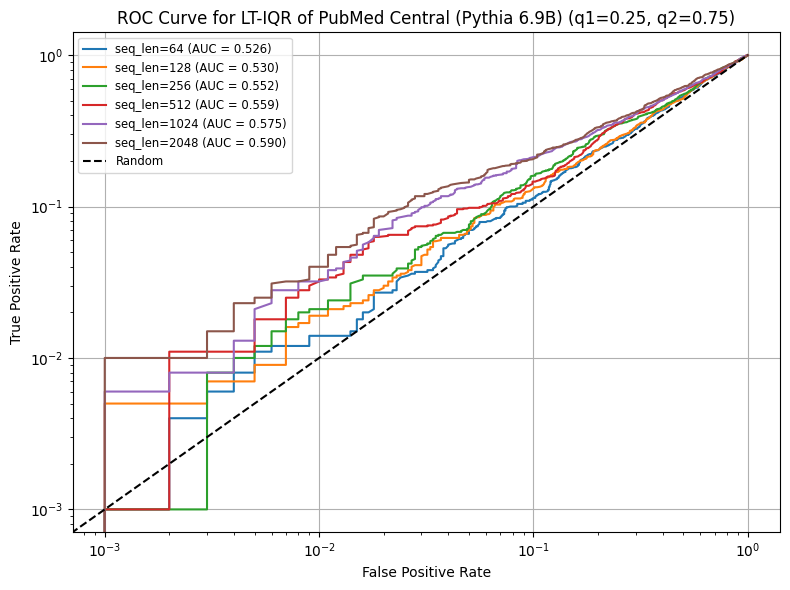

In [53]:
pubmedc_144_cp_aucs, pubmedc_144_cp_tpr = plot_roc_iqr_single_plot(dataset_pubmedc_pythia69b, loss_columns, "PubMed Central (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research

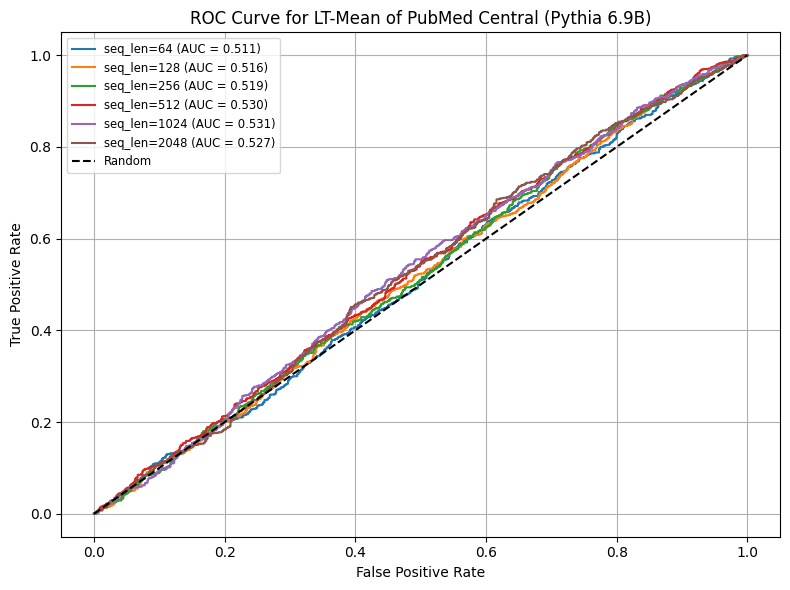

In [54]:
pubmedc_144_cp_mean_aucs, pubmedc_144_cp_mean_tprs = plot_loss_trace_mean(dataset_pubmedc_pythia69b, loss_columns, "PubMed Central (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmen

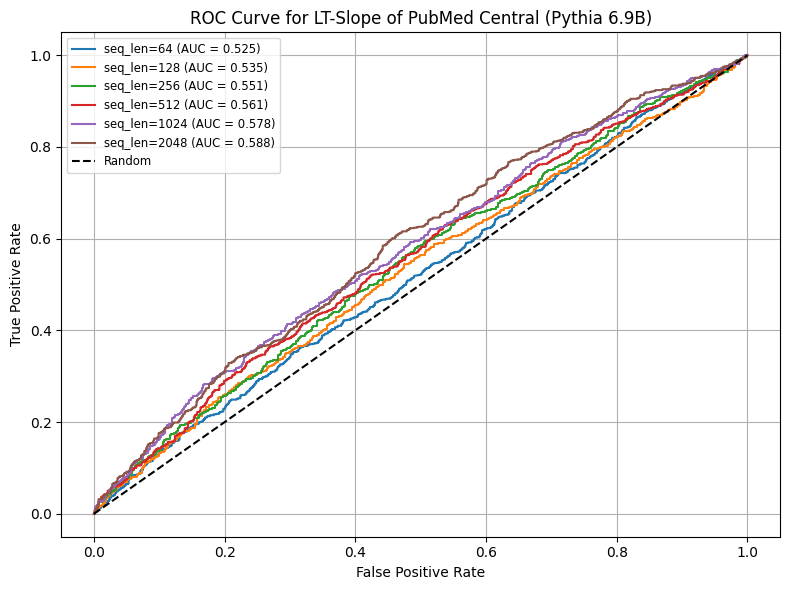

In [55]:
pubmedc_144_cp_slope_aucs, pubmedc_144_cp_slope_tpr = plot_loss_trace_slope(dataset_pubmedc_pythia69b, loss_columns, "PubMed Central (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

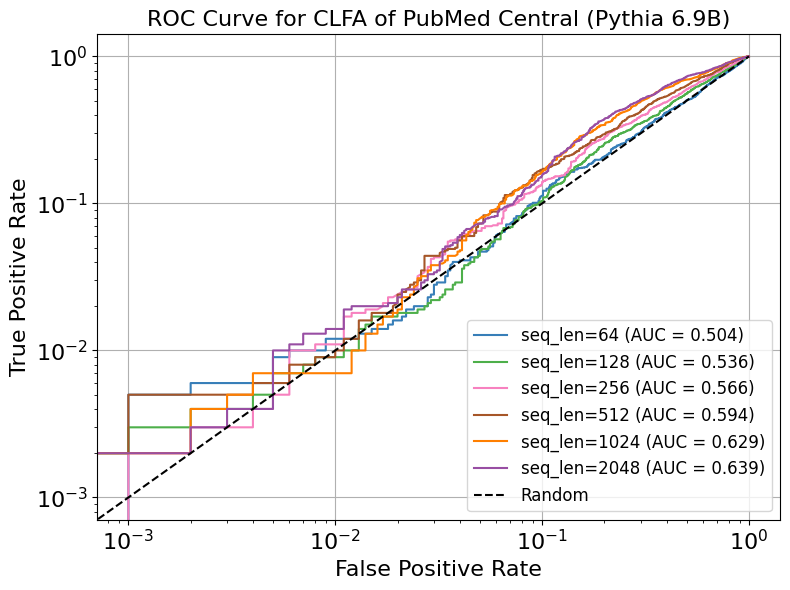

In [56]:
pubmedc_144_cp_clfa_aucs, pubmedc_144_cp_clfa_tprs = plot_clfa_normalized(dataset_pubmedc_pythia69b, loss_columns, "PubMed Central (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 

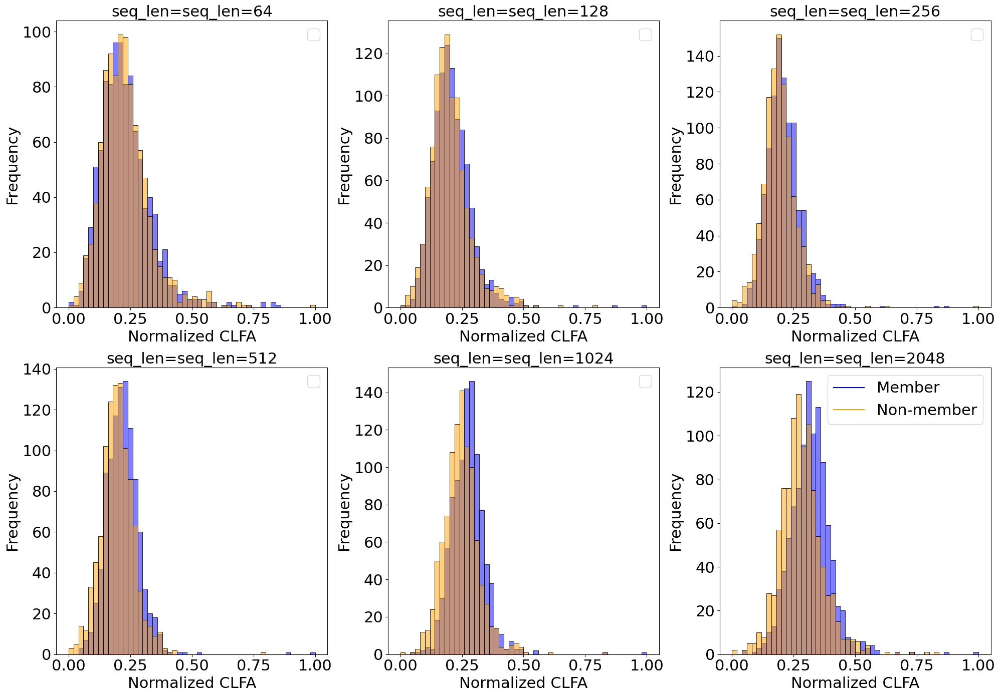

In [57]:
plot_clfa_norm_distribution(dataset_pubmedc_pythia69b, "PubMed Central (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  for i, (title, df) in enumerate(dataset_dict.items()):
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.p

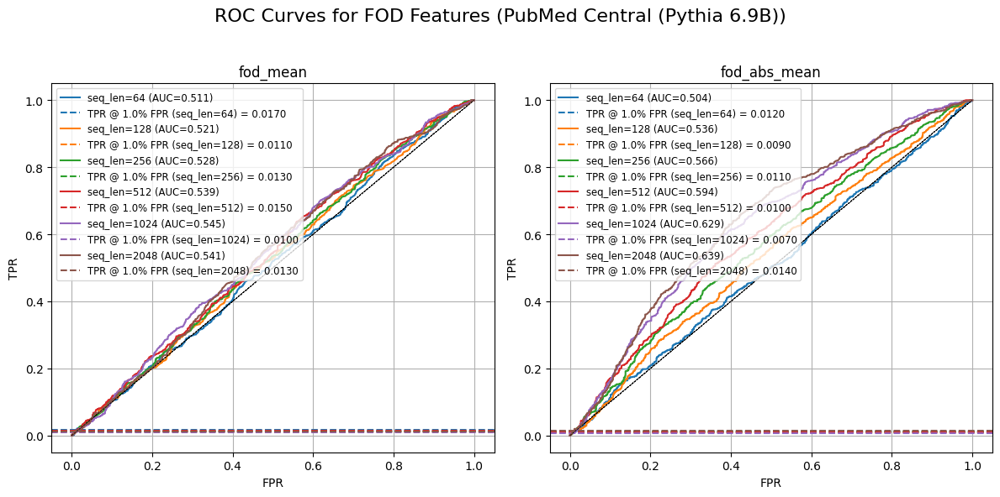

In [58]:
pubmedc_144_fod_mean, pubmedc_144_fod_mean_tpr, pubmedc_144_fod_abs_mean, pubmedc_144_fod_abs_mean_tpr = plot_fod(dataset_pubmedc_pythia69b, "PubMed Central (Pythia 6.9B)", loss_columns, target_fpr)

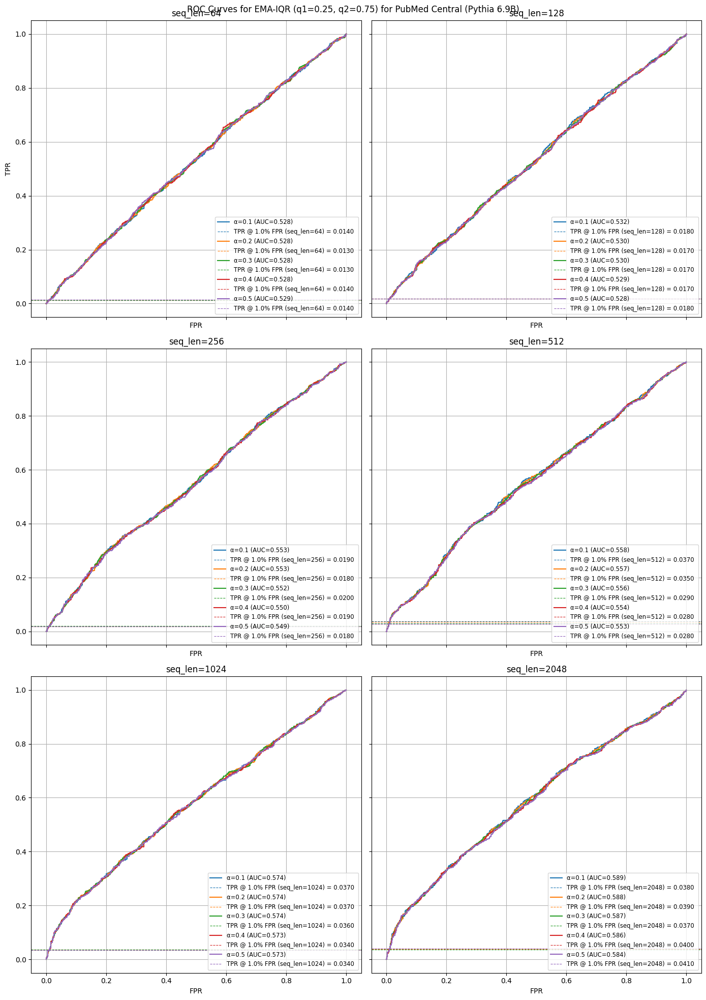

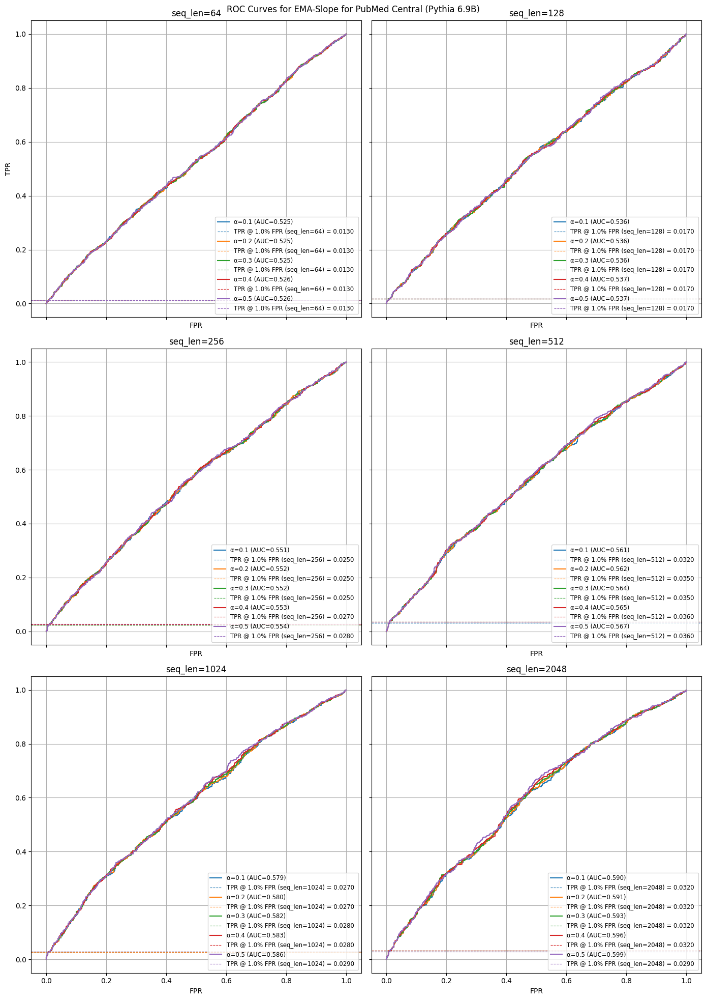

In [59]:
dataset_ema_pubmedc_144_pythia69b = {}
pubmedc_144_cp_ema_iqr_aucs, pubmedc_144_cp_ema_iqr_tprs, pubmedc_144_cp_ema_slope_aucs, pubmedc_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_pubmedc_pythia69b, dataset_ema_pubmedc_144_pythia69b, "PubMed Central (Pythia 6.9B)", loss_columns, target_fpr)

### Normalised Loss Traces (PubMed Central 6.9B)

In [60]:
dataset_pubmedc_pythia69b_normalised = normalize_loss_dfs(dataset_pubmedc_pythia69b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


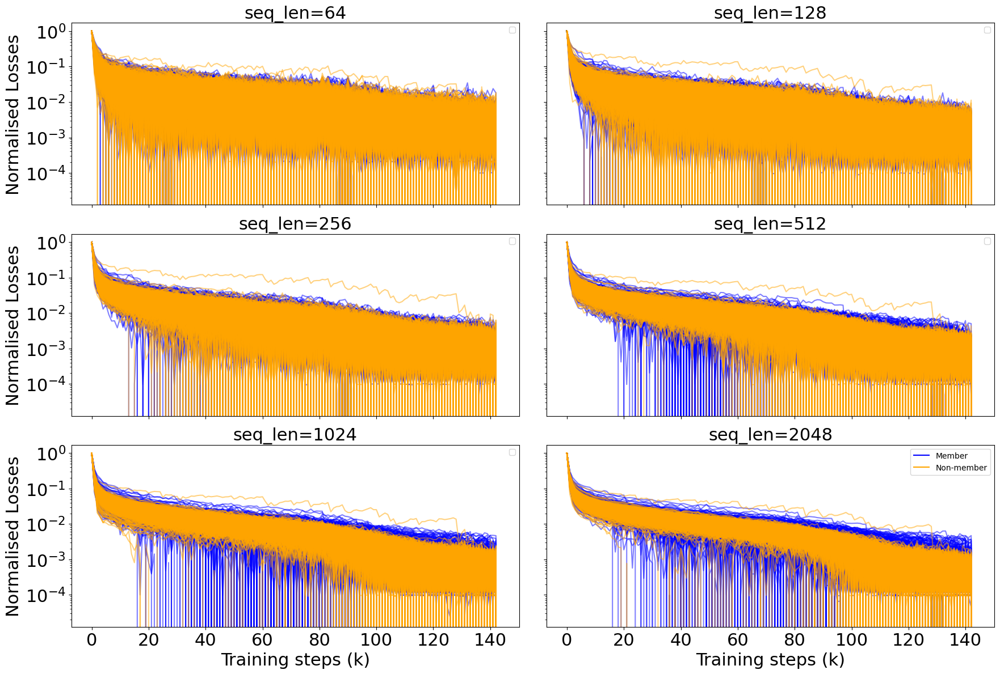

In [61]:
plot_indv_loss_curves(dataset_pubmedc_pythia69b_normalised, k_values, "PubMed Central Normalised Losses (Pythia 6.9B)")

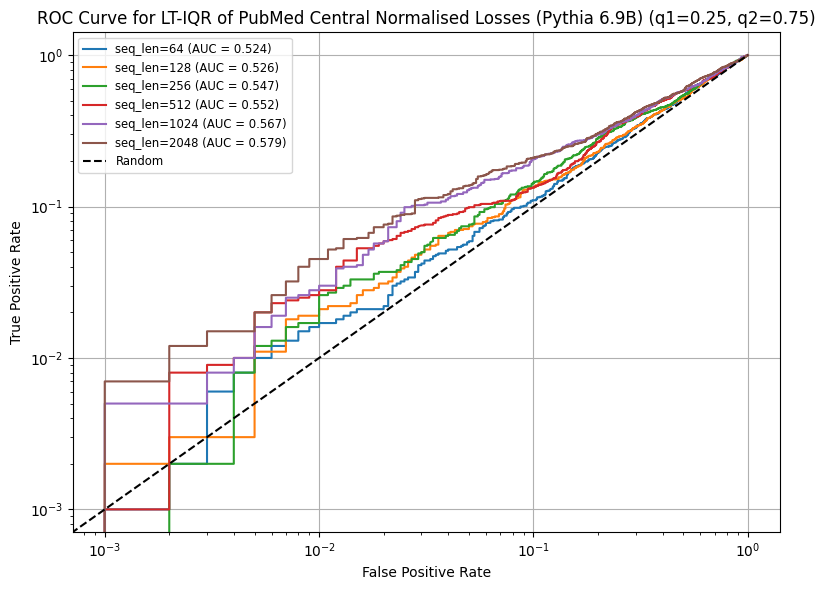

In [62]:
pubmedc_144_cp_norm_aucs, pubmedc_144_cp_norm_tpr = plot_roc_iqr_single_plot(dataset_pubmedc_pythia69b_normalised, loss_columns, "PubMed Central Normalised Losses (Pythia 6.9B)", target_fpr, True)


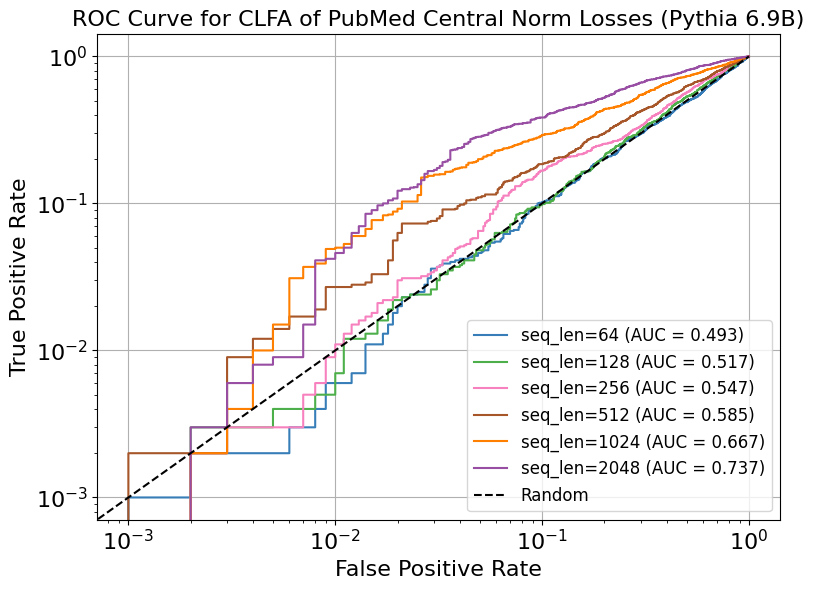

In [63]:
pubmedc_144_cp_norm_clfa_aucs, pubmedc_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_pubmedc_pythia69b_normalised, loss_columns, "PubMed Central Norm Losses (Pythia 6.9B)", target_fpr, True)

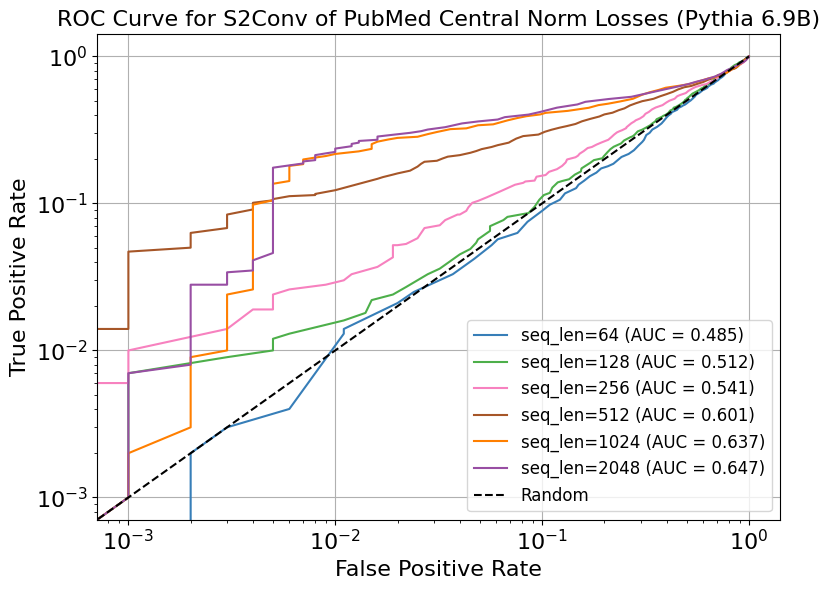

In [64]:
pubmedc_144_cp_norm_s2conv_aucs, pubmedc_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_pubmedc_pythia69b_normalised, loss_columns, "PubMed Central Norm Losses (Pythia 6.9B)", target_fpr)

## USPTO Pythia 6.9B (Pile-RS-Truncated)

In [65]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_uspto_pythia69b = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/uspto/pythia6-9b_processed/pile_reservoirv2_uspto_seqlen{seqlen}_pythia-6.9b_processed.pkl", "rb") as f:
        dataset_uspto_pythia69b[seqlen] = pd.read_pickle(f)


In [71]:
dataset_uspto_pythia69b["seq_len=64"] = dataset_uspto_pythia69b.pop(64)
dataset_uspto_pythia69b["seq_len=128"] = dataset_uspto_pythia69b.pop(128)
dataset_uspto_pythia69b["seq_len=256"] = dataset_uspto_pythia69b.pop(256)
dataset_uspto_pythia69b["seq_len=512"] = dataset_uspto_pythia69b.pop(512)
dataset_uspto_pythia69b["seq_len=1024"] = dataset_uspto_pythia69b.pop(1024)
dataset_uspto_pythia69b["seq_len=2048"] = dataset_uspto_pythia69b.pop(2048)

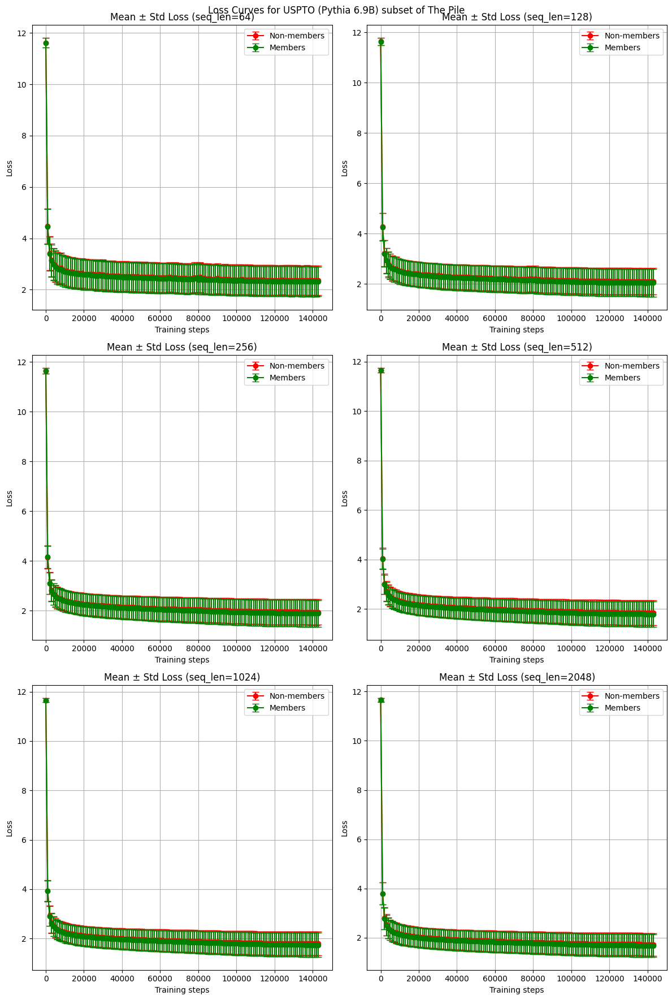

In [72]:
plot_loss_curves(dataset_uspto_pythia69b, "USPTO (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


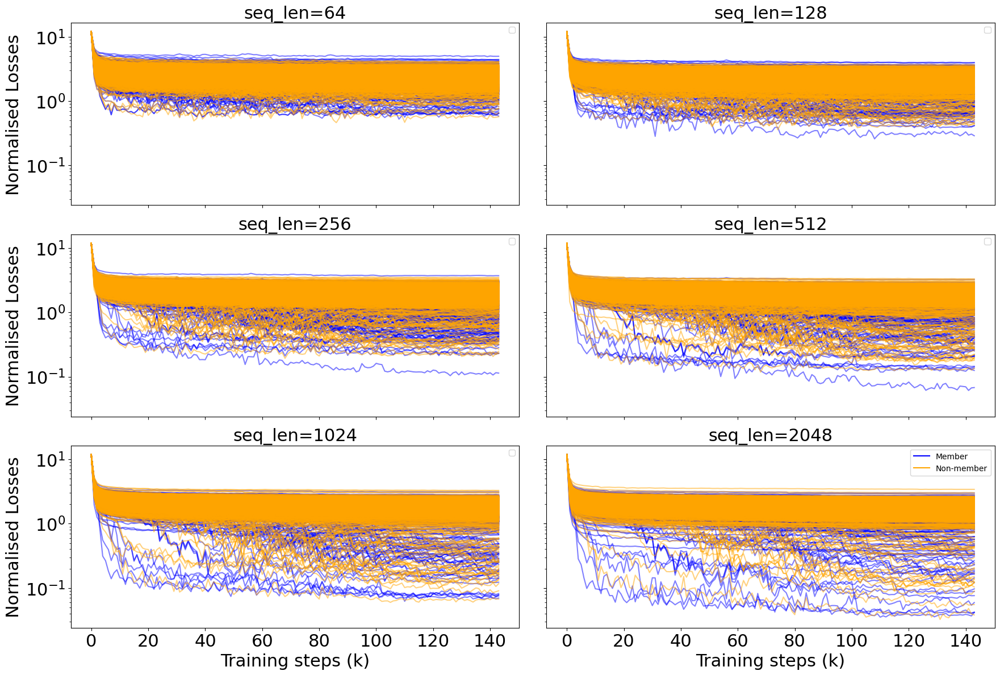

In [73]:
plot_indv_loss_curves(dataset_uspto_pythia69b, k_values, dataset_name="USPTO (Pythia 6.9B)")

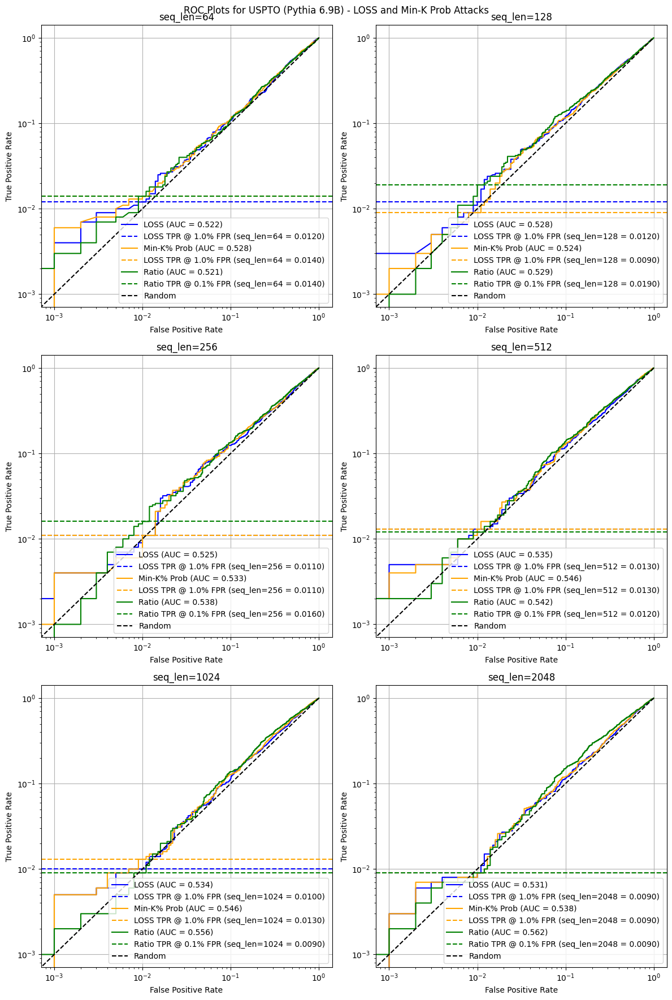

In [74]:
uspto_loss_aucs, uspto_loss_tpr_at_target, uspto_minkprob_aucs, uspto_minkprob_tpr_at_target, uspto_ratio_aucs, uspto_ratio_tpr_at_target = plot_roc_curves(dataset_uspto_pythia69b, "USPTO (Pythia 6.9B)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

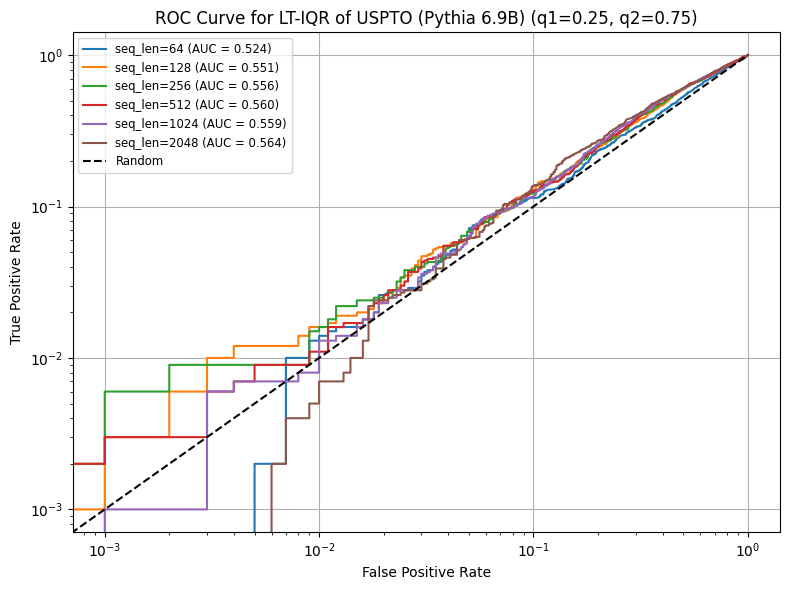

In [75]:
uspto_144_cp_aucs, uspto_144_cp_tpr = plot_roc_iqr_single_plot(dataset_uspto_pythia69b, loss_columns, "USPTO (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research

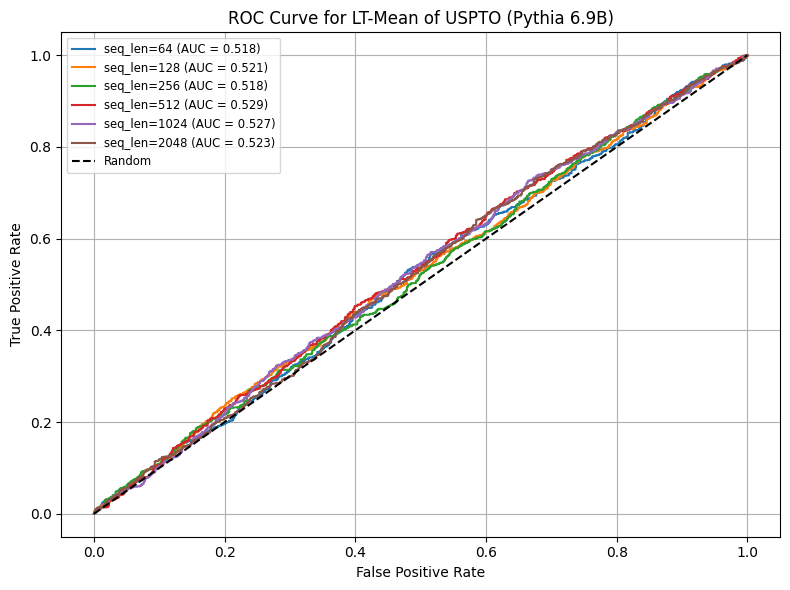

In [76]:
uspto_144_cp_mean_aucs, uspto_144_cp_mean_tprs = plot_loss_trace_mean(dataset_uspto_pythia69b, loss_columns, "USPTO (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmen

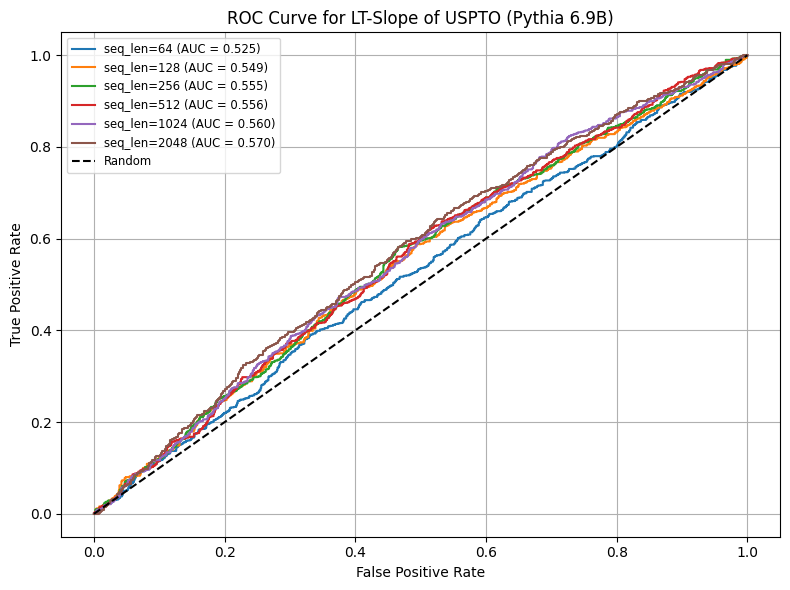

In [77]:
uspto_144_cp_slope_aucs, uspto_144_cp_slope_tpr = plot_loss_trace_slope(dataset_uspto_pythia69b, loss_columns, "USPTO (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

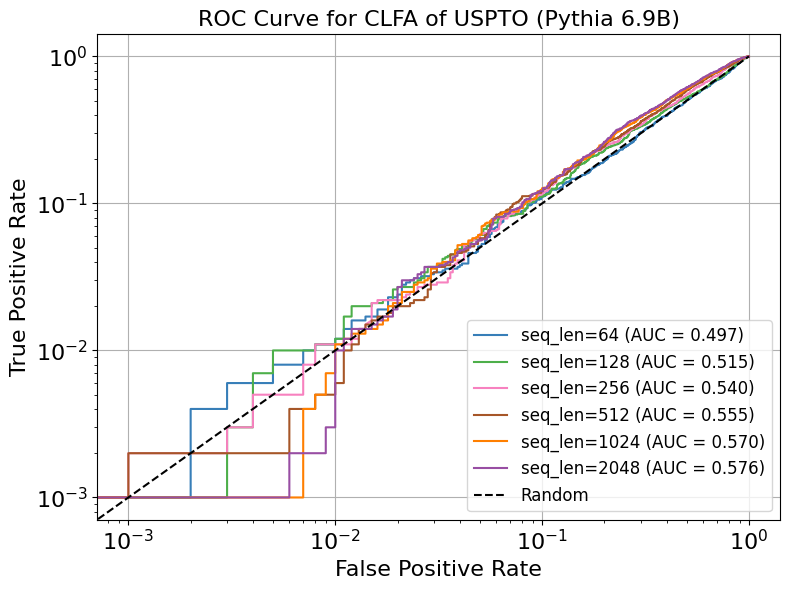

In [78]:
uspto_144_cp_clfa_aucs, uspto_144_cp_clfa_tprs = plot_clfa_normalized(dataset_uspto_pythia69b, loss_columns, "USPTO (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 

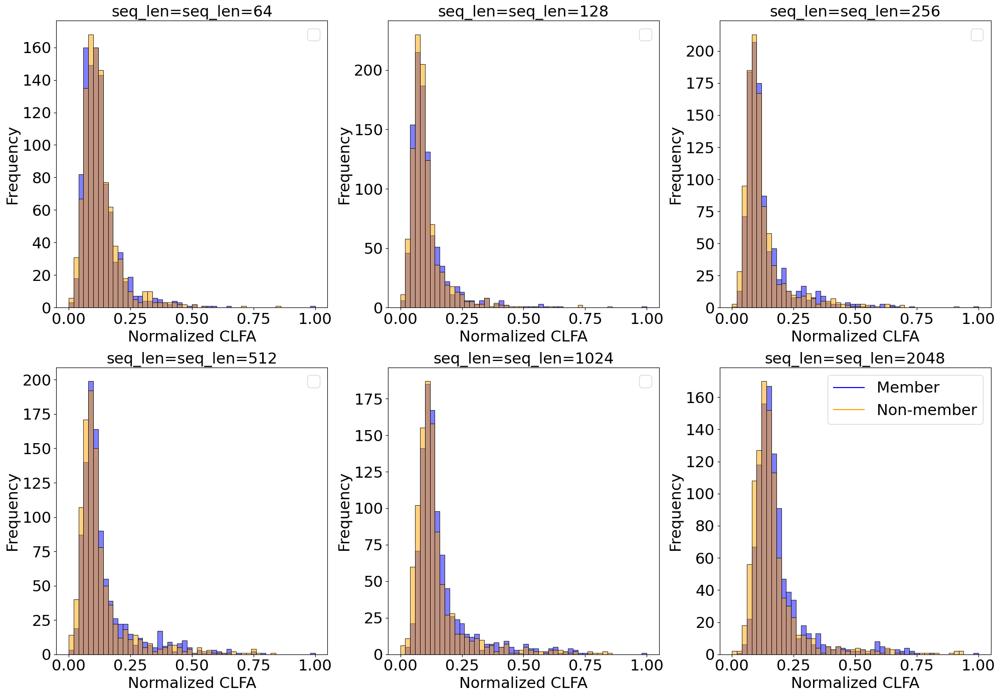

In [79]:
plot_clfa_norm_distribution(dataset_uspto_pythia69b, "USPTO (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  for i, (title, df) in enumerate(dataset_dict.items()):
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.p

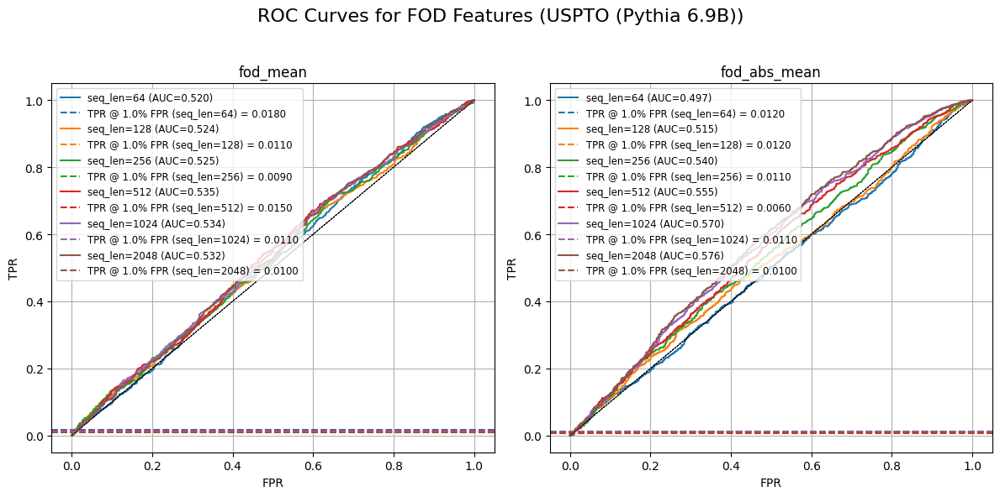

In [80]:
uspto_144_fod_mean, uspto_144_fod_mean_tpr, uspto_144_fod_abs_mean, uspto_144_fod_abs_mean_tpr = plot_fod(dataset_uspto_pythia69b, "USPTO (Pythia 6.9B)", loss_columns, target_fpr)

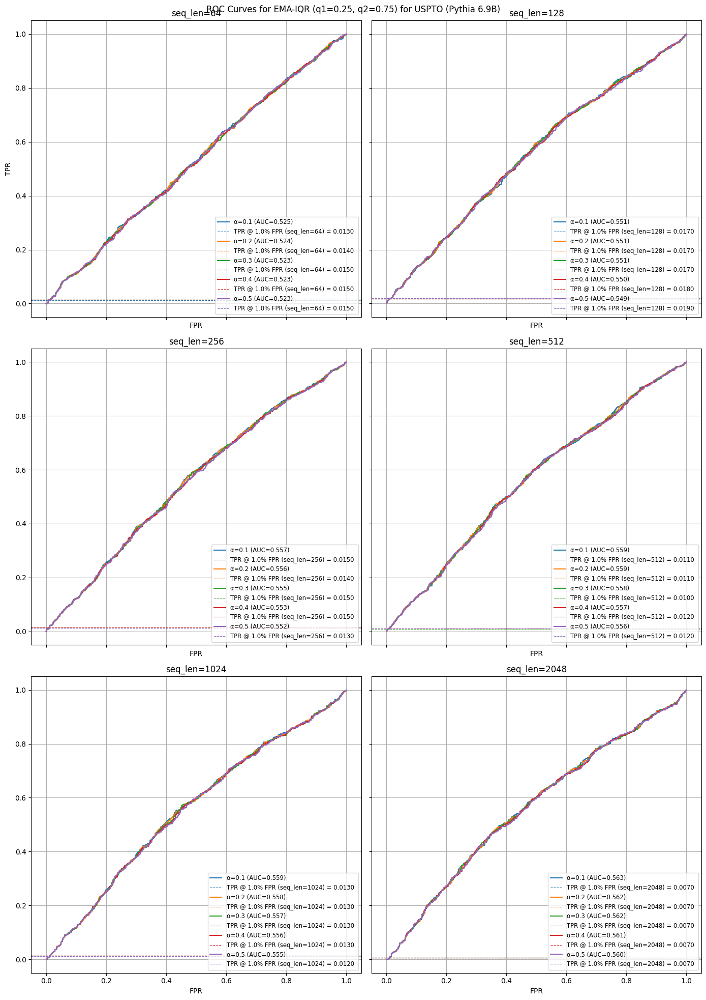

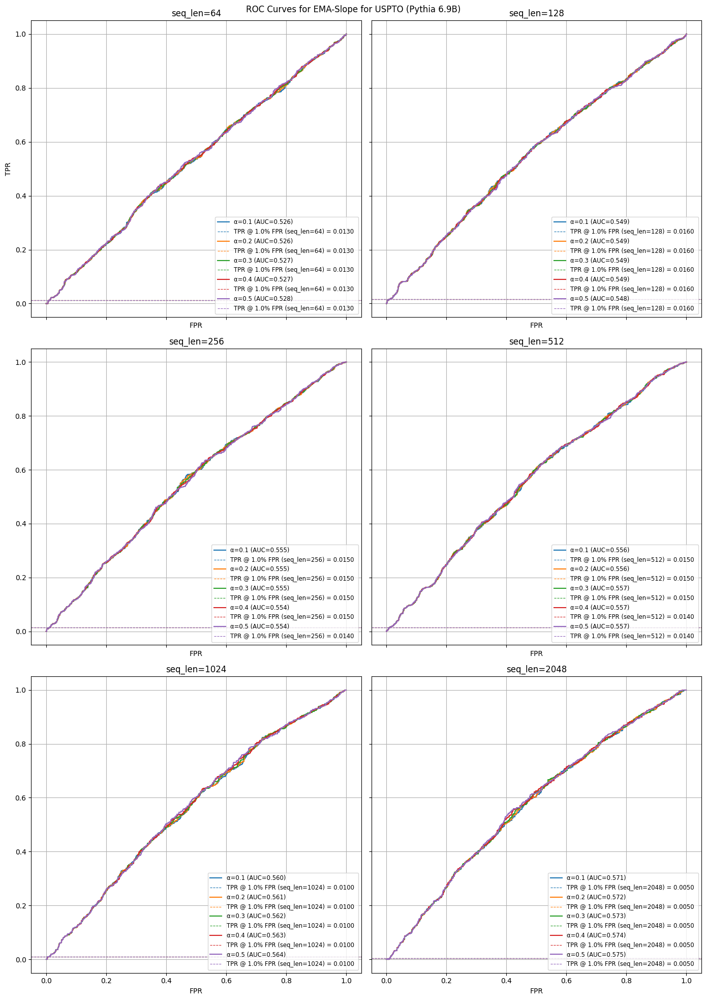

In [81]:
dataset_ema_uspto_144_pythia69b = {}
uspto_144_cp_ema_iqr_aucs, uspto_144_cp_ema_iqr_tprs, uspto_144_cp_ema_slope_aucs, uspto_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_uspto_pythia69b, dataset_ema_uspto_144_pythia69b, "USPTO (Pythia 6.9B)", loss_columns, target_fpr)

### Normalised Loss Traces (USPTO 6.9B)

In [82]:
dataset_uspto_pythia69b_normalised = normalize_loss_dfs(dataset_uspto_pythia69b, loss_columns)

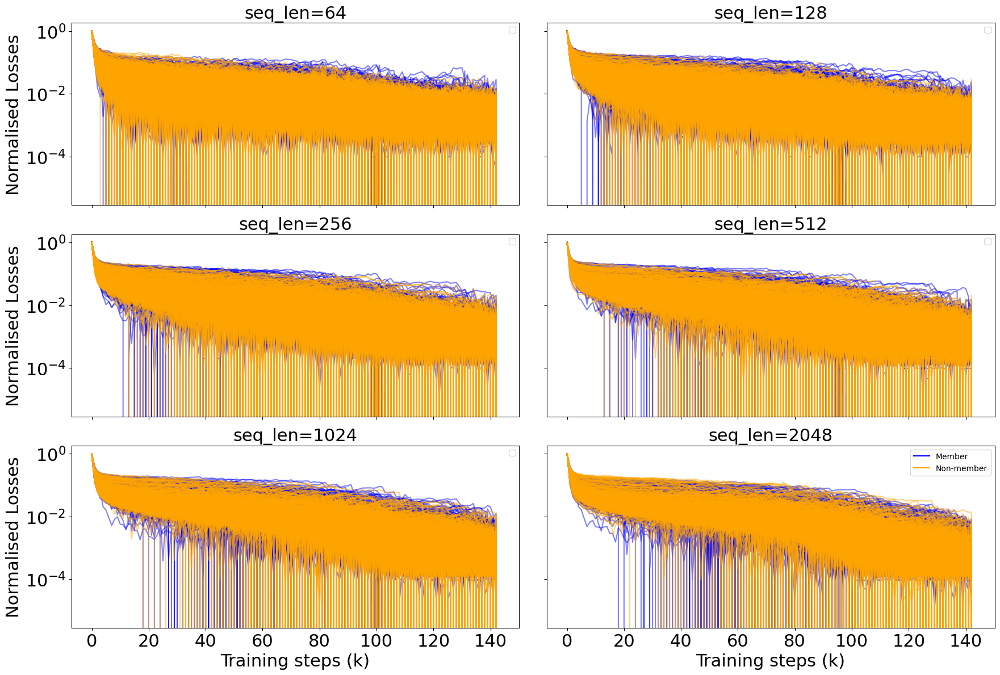

In [84]:
plot_indv_loss_curves(dataset_uspto_pythia69b_normalised, k_values, "USPTO Normalised Losses (Pythia 6.9B)")

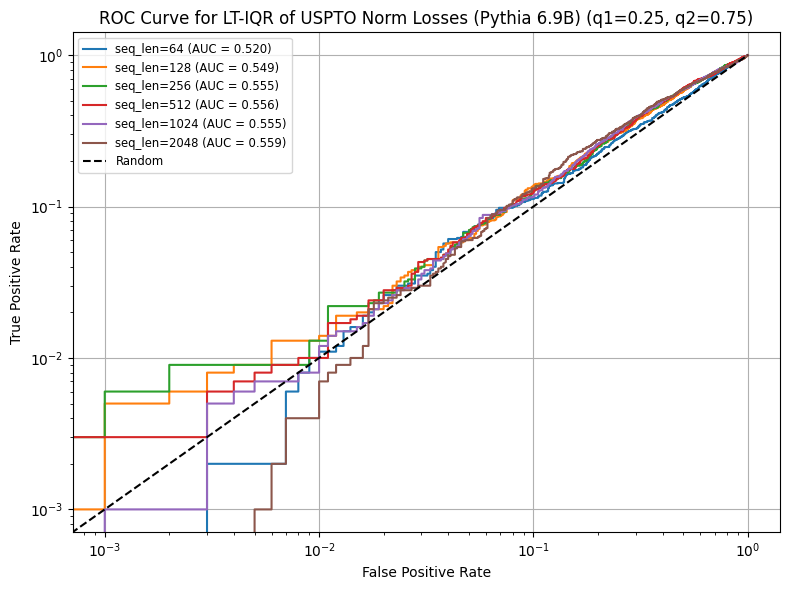

In [85]:
uspto_144_cp_norm_aucs, uspto_144_cp_norm_tpr = plot_roc_iqr_single_plot(dataset_uspto_pythia69b_normalised, loss_columns, "USPTO Norm Losses (Pythia 6.9B)", target_fpr, True)

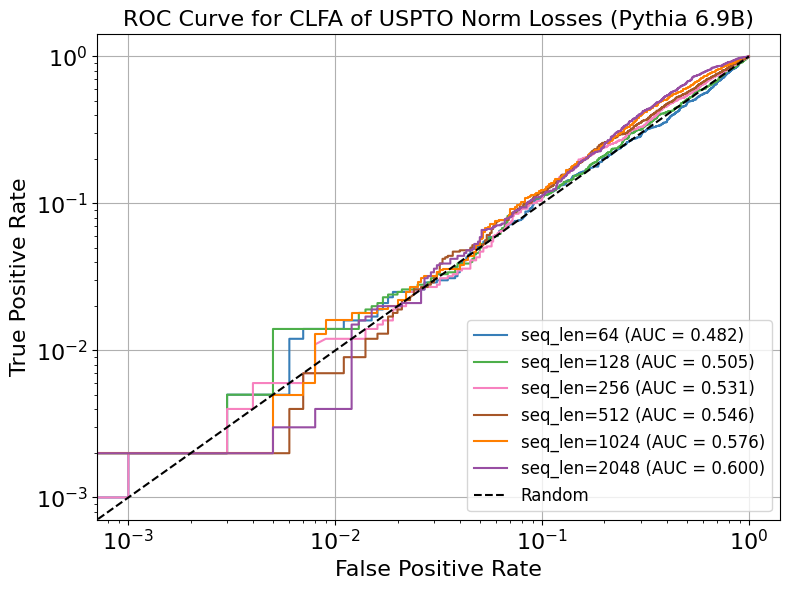

In [86]:
uspto_144_cp_norm_clfa_aucs, uspto_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_uspto_pythia69b_normalised, loss_columns, "USPTO Norm Losses (Pythia 6.9B)", target_fpr, True)

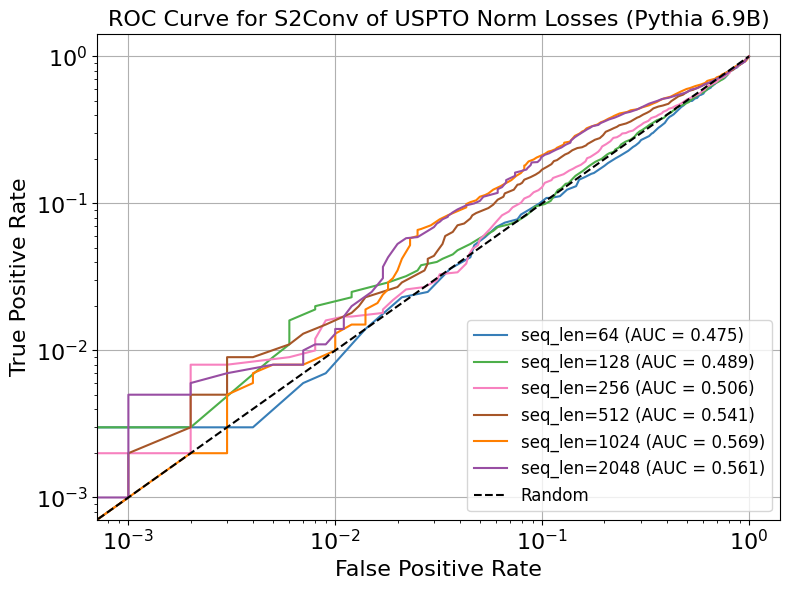

In [87]:
uspto_144_cp_norm_s2conv_aucs, uspto_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_uspto_pythia69b_normalised, loss_columns, "USPTO Norm Losses (Pythia 6.9B)", target_fpr )

## Pile-CC Pythia 6.9B (Pile-RS-Truncated)

In [29]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_pilecc_pythia69b = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/pilecc/pythia6-9b_processed/pile_reservoirv2_pilecc_seqlen{seqlen}_pythia-6.9b_processed.pkl", "rb") as f:
        dataset_pilecc_pythia69b[seqlen] = pd.read_pickle(f)


In [31]:
dataset_pilecc_pythia69b["seq_len=64"] = dataset_pilecc_pythia69b.pop(64)
dataset_pilecc_pythia69b["seq_len=128"] = dataset_pilecc_pythia69b.pop(128)
dataset_pilecc_pythia69b["seq_len=256"] = dataset_pilecc_pythia69b.pop(256)
dataset_pilecc_pythia69b["seq_len=512"] = dataset_pilecc_pythia69b.pop(512)
dataset_pilecc_pythia69b["seq_len=1024"] = dataset_pilecc_pythia69b.pop(1024)
dataset_pilecc_pythia69b["seq_len=2048"] = dataset_pilecc_pythia69b.pop(2048)

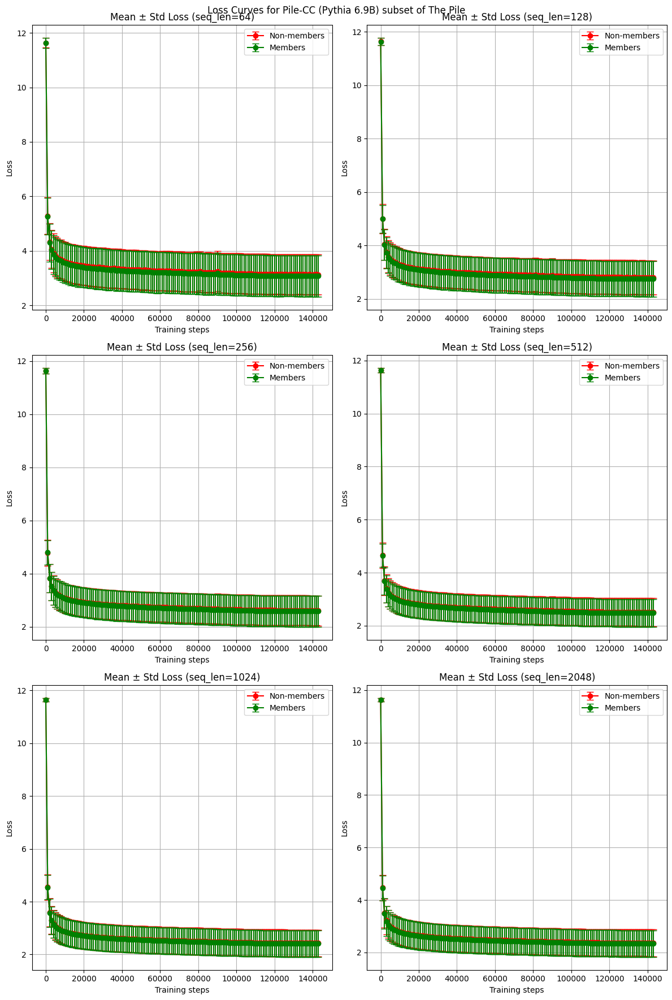

In [32]:
plot_loss_curves(dataset_pilecc_pythia69b, "Pile-CC (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


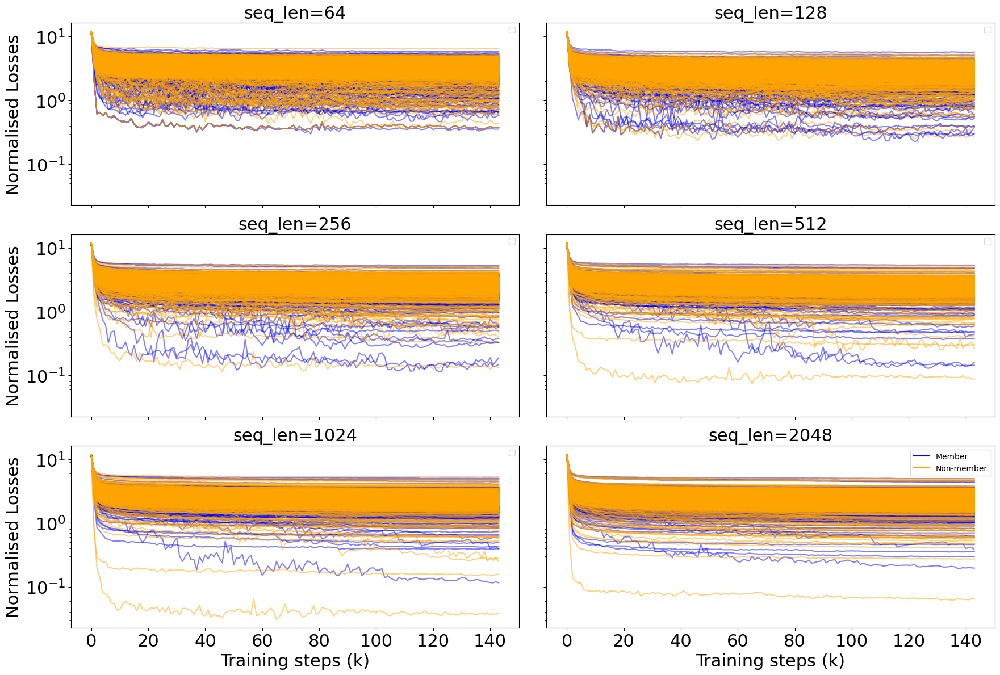

In [33]:
plot_indv_loss_curves(dataset_pilecc_pythia69b, k_values, dataset_name="Pile-CC (Pythia 6.9B)")

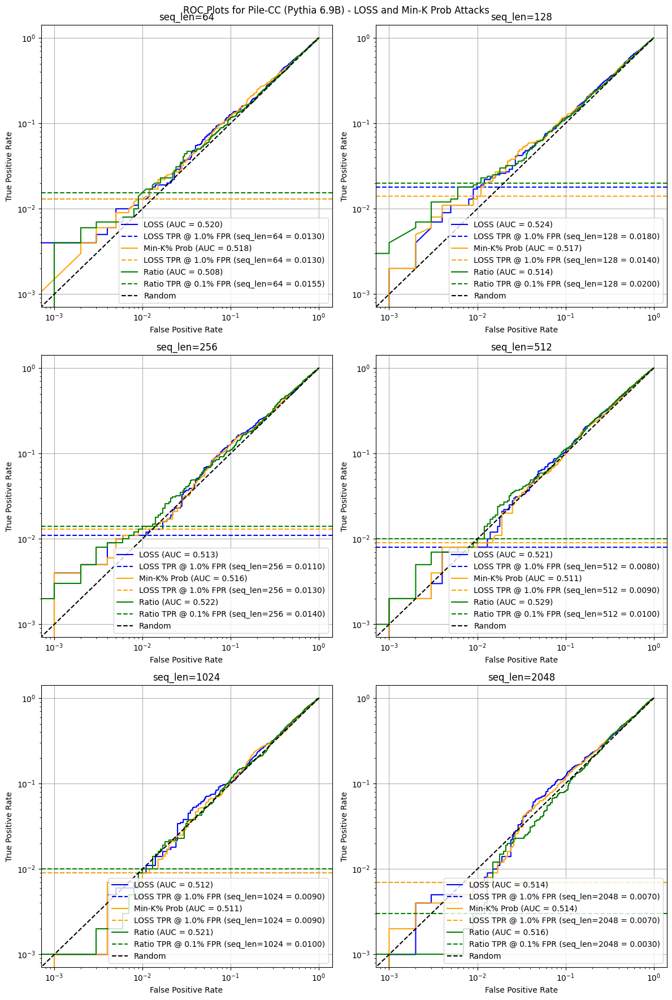

In [34]:
pilecc_loss_aucs, pilecc_loss_tpr_at_target, pilecc_minkprob_aucs, pilecc_minkprob_tpr_at_target, pilecc_ratio_aucs, pilecc_ratio_tpr_at_target = plot_roc_curves(dataset_pilecc_pythia69b, "Pile-CC (Pythia 6.9B)", target_fpr)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df["loss_traces"] = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:16: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = iqr_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/p

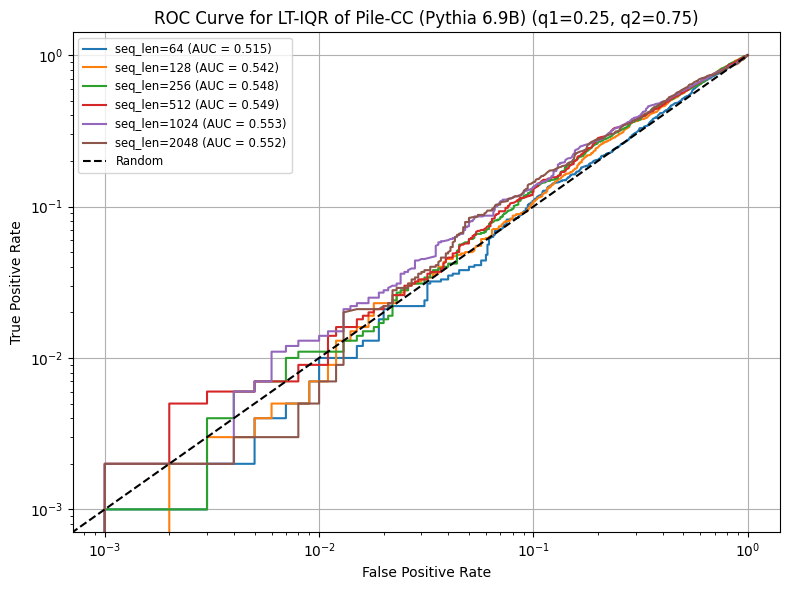

In [35]:
pilecc_144_cp_aucs, pilecc_144_cp_tpr = plot_roc_iqr_single_plot(dataset_pilecc_pythia69b, loss_columns, "Pile-CC (Pythia 6.9B)",target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:278: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  selected_loss_trace_values = df[loss_columns].values.tolist()
/Users/ongsici/Documents/Imperial_MSc_Computing/Research

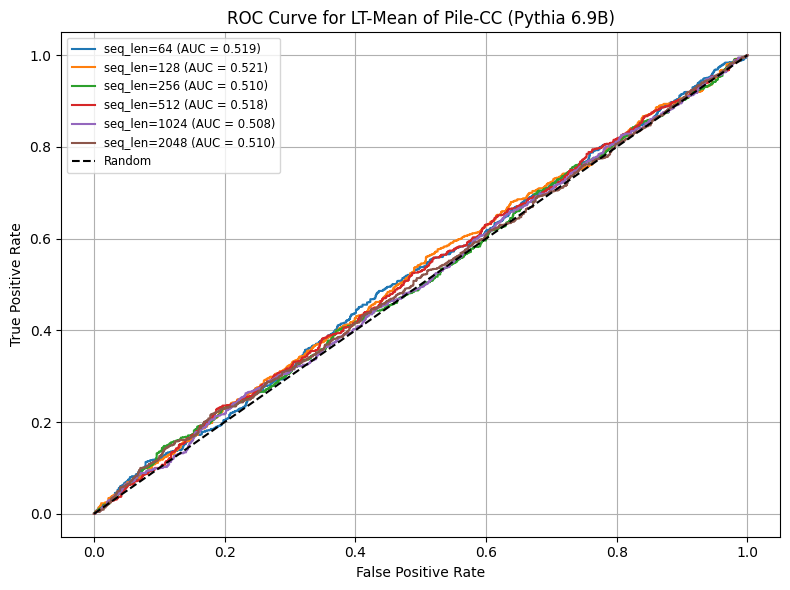

In [36]:
pilecc_144_cp_mean_aucs, pilecc_144_cp_mean_tprs = plot_loss_trace_mean(dataset_pilecc_pythia69b, loss_columns, "Pile-CC (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:236: PerformanceWarning: DataFrame is highly fragmen

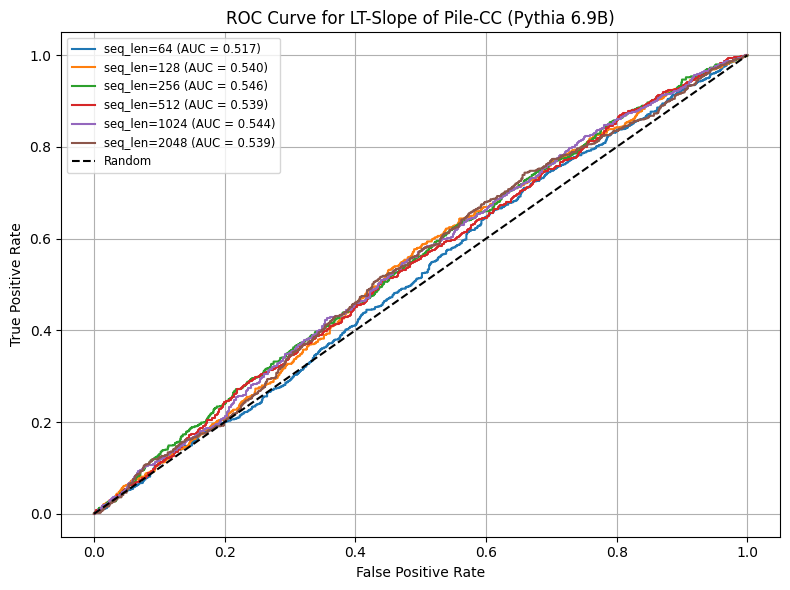

In [37]:
pilecc_144_cp_slope_aucs, pilecc_144_cp_slope_tprs = plot_loss_trace_slope(dataset_pilecc_pythia69b, loss_columns, "Pile-CC (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['clfa'] = clfa_values
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:64: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df[col_name] = clfa_normalized
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../mia.py:63: Pe

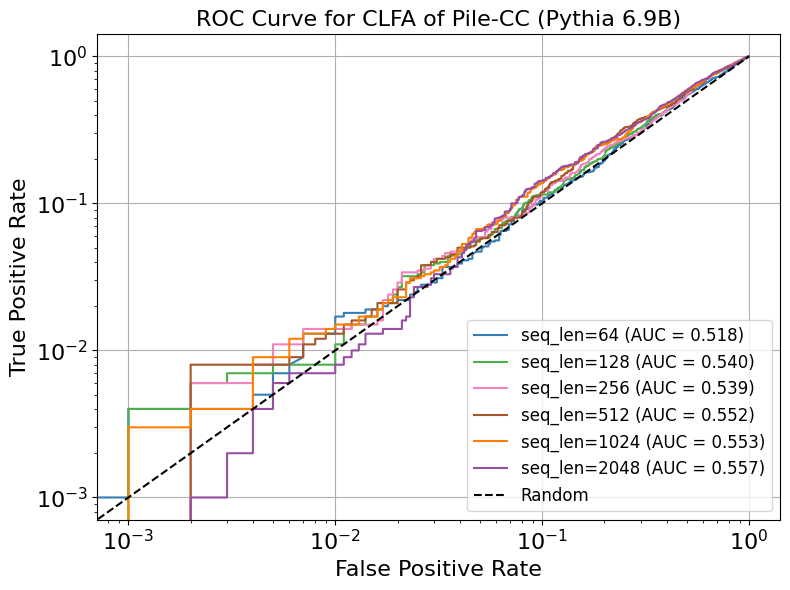

In [38]:
pilecc_144_cp_clfa_aucs, pilecc_144_cp_clfa_tprs = plot_clfa_normalized(dataset_pilecc_pythia69b, loss_columns, "Pile-CC (Pythia 6.9B)", target_fpr, True)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.set_xlabel('Normalized CLFA', fontsize=22)
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:377: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
 

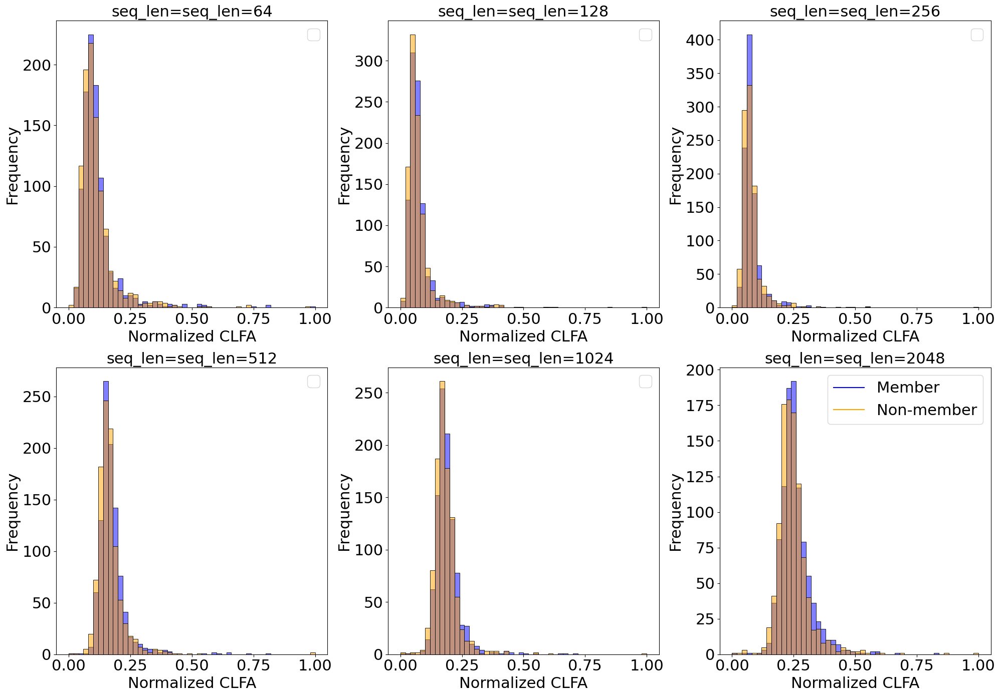

In [39]:
plot_clfa_norm_distribution(dataset_pilecc_pythia69b, "Pile-CC (Pythia 6.9B)")

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:403: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:404: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  for i, (title, df) in enumerate(dataset_dict.items()):
/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.p

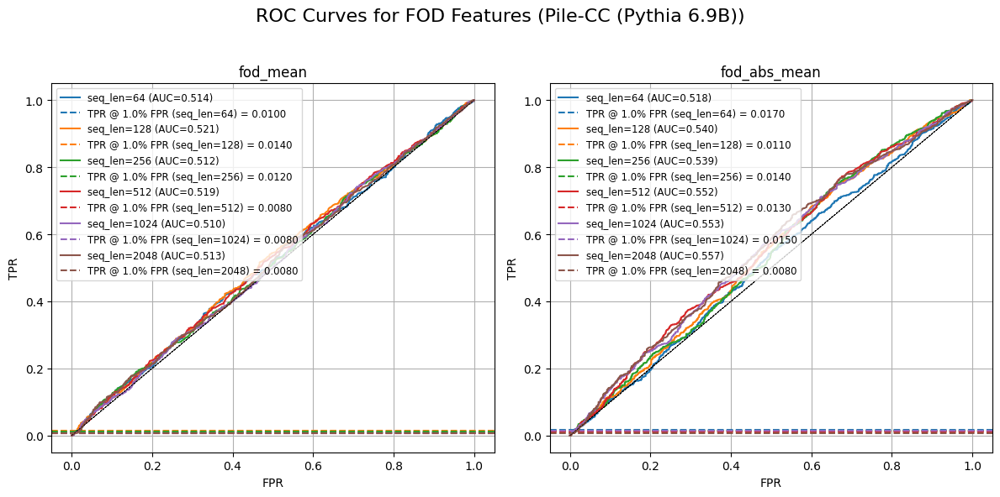

In [40]:
pilecc_144_fod_mean, pilecc_144_fod_mean_tpr, pilecc_144_fod_abs_mean, pilecc_144_fod_abs_mean_tpr = plot_fod(dataset_pilecc_pythia69b, "Pile-CC (Pythia 6.9B)", loss_columns, target_fpr)

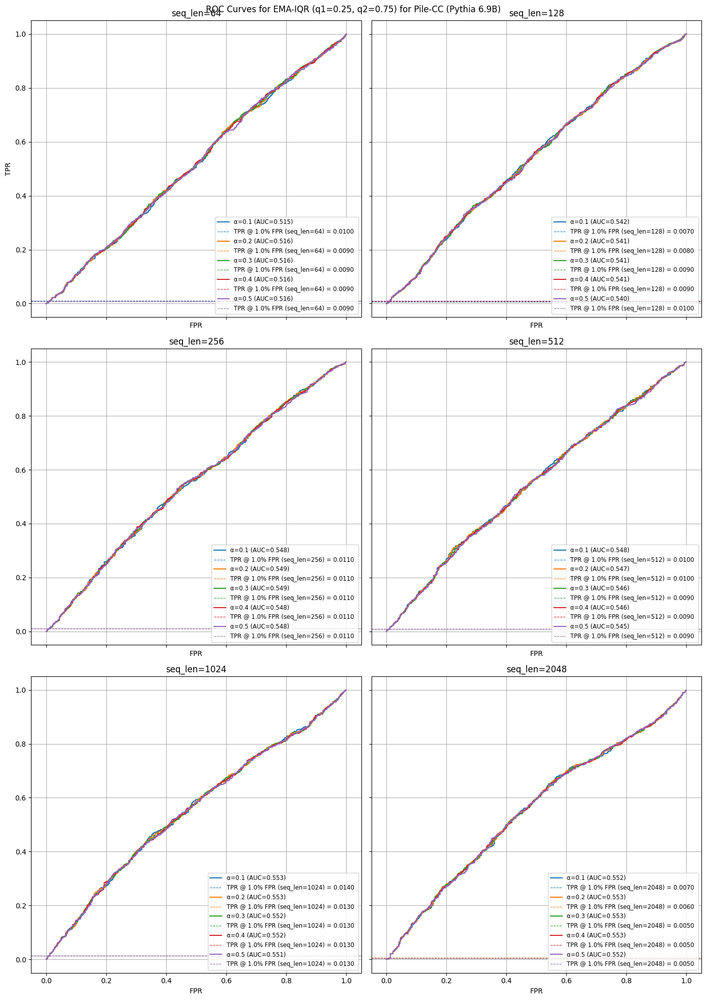

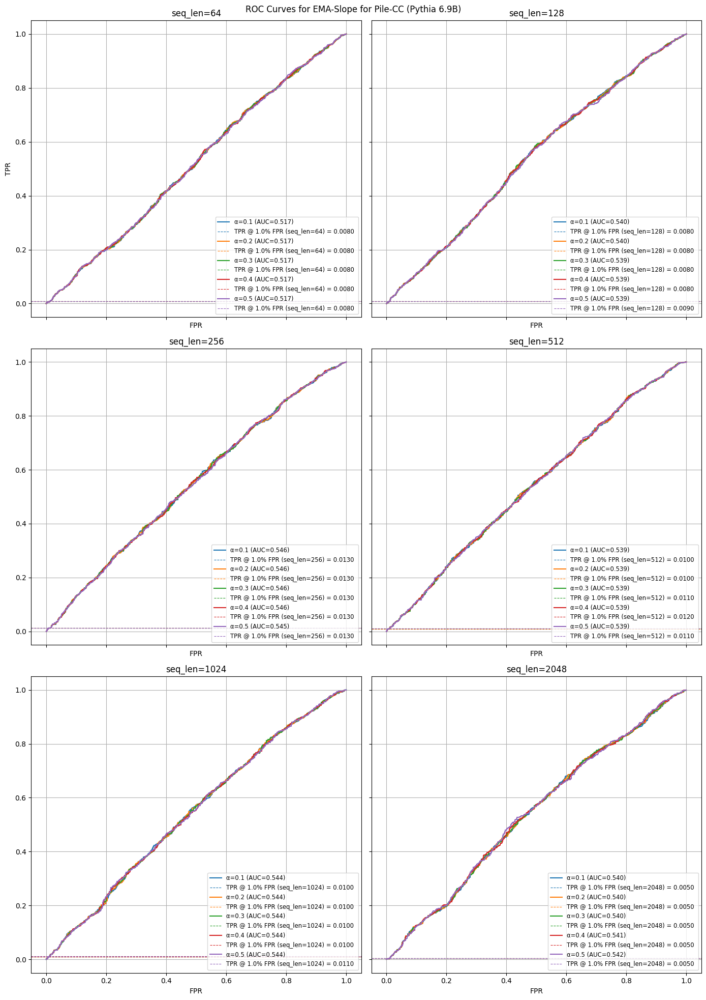

In [41]:
dataset_ema_pilecc_144_pythia69b = {}
pilecc_144_cp_ema_iqr_aucs, pilecc_144_cp_ema_iqr_tprs, pilecc_144_cp_ema_slope_aucs, pilecc_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_pilecc_pythia69b, dataset_ema_pilecc_144_pythia69b, "Pile-CC (Pythia 6.9B)", loss_columns, target_fpr)

### Normalised Loss Traces (Pile-CC 6.9B)

In [42]:
dataset_pilecc_pythia69b_normalised = normalize_loss_dfs(dataset_pilecc_pythia69b, loss_columns)

/Users/ongsici/Documents/Imperial_MSc_Computing/Research_Project/checkpoints_mia/checkpoint_mia_techniques/pythia/../utils.py:102: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


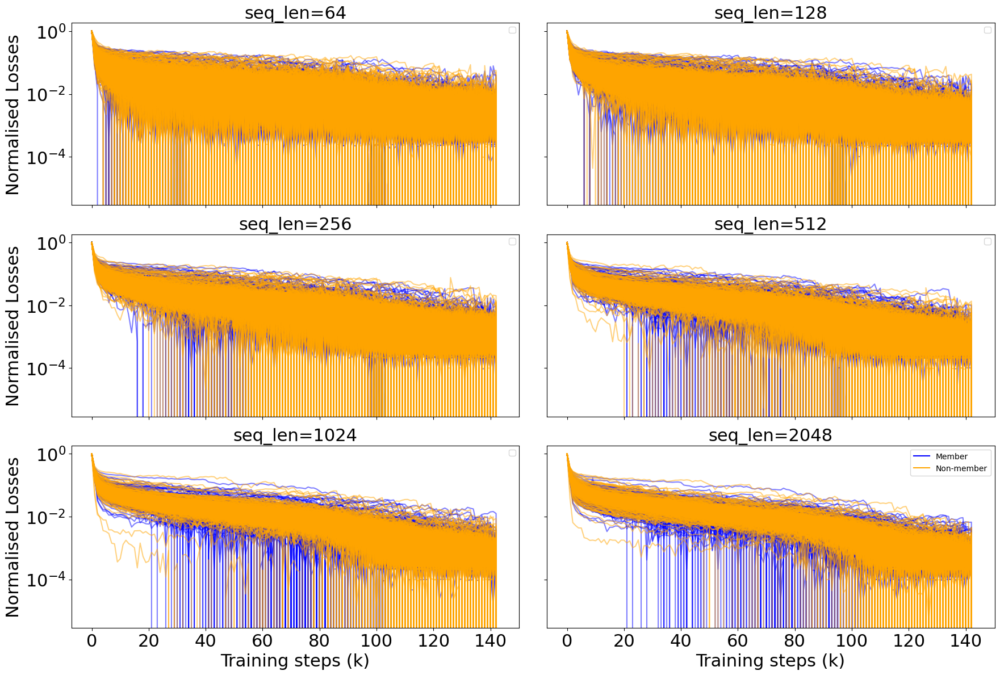

In [43]:
plot_indv_loss_curves(dataset_pilecc_pythia69b_normalised, k_values, "Pile-CC Normalised Losses (Pythia 6.9B)")

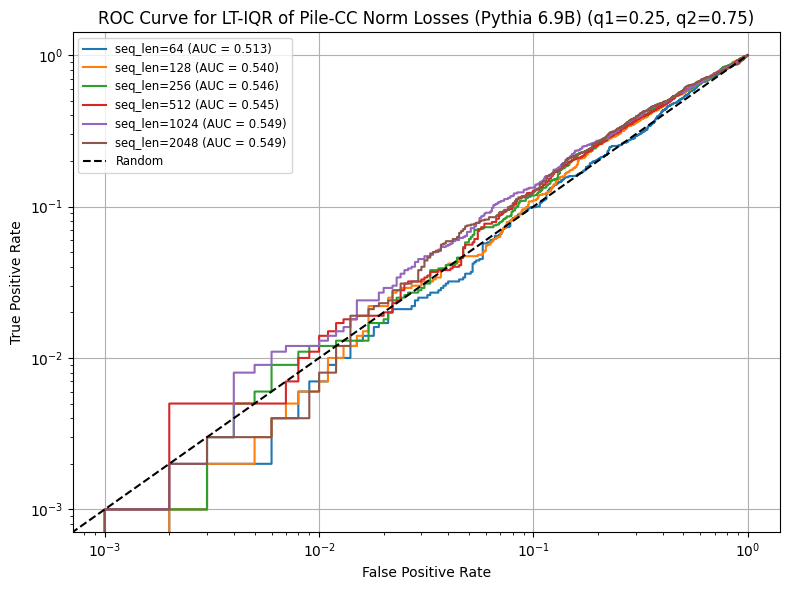

In [44]:
pilecc_144_cp_norm_aucs, pilecc_144_cp_norm_tpr = plot_roc_iqr_single_plot(dataset_pilecc_pythia69b_normalised, loss_columns, "Pile-CC Norm Losses (Pythia 6.9B)",target_fpr, True)

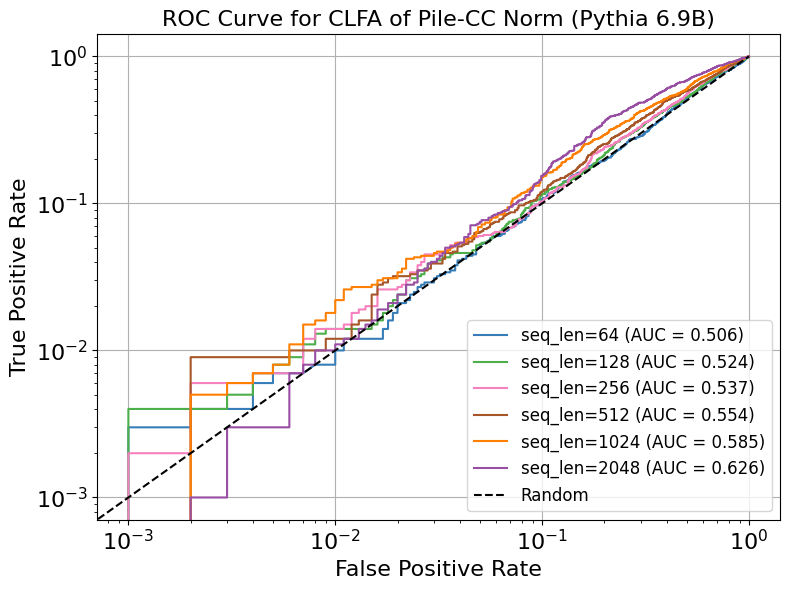

In [45]:
pilecc_144_cp_norm_clfa_aucs, pilecc_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_pilecc_pythia69b_normalised, loss_columns, "Pile-CC Norm (Pythia 6.9B)", target_fpr, True)

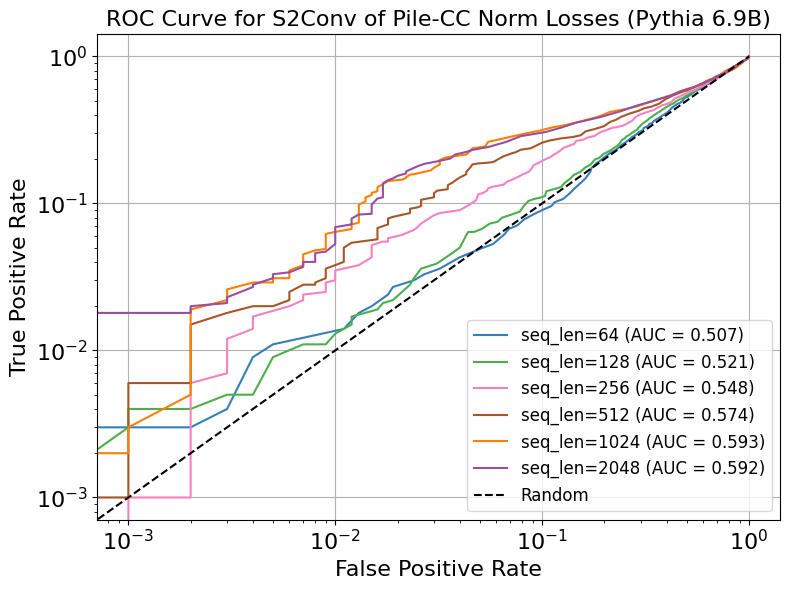

In [46]:
pilecc_144_cp_norm_s2conv_aucs, pilecc_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_pilecc_pythia69b_normalised, loss_columns, "Pile-CC Norm Losses (Pythia 6.9B)", target_fpr )

## Github Pythia 6.9B (Pile-RS-Truncated)

In [30]:
seq_lens = [64, 128, 256, 512, 1024, 2048]
dataset_github_pythia69b = {}

for seqlen in seq_lens:
    with open(f"../../data/pile/pile_rs_truncated/github/pythia6-9b_processed/pile_reservoirv2_github_seqlen{seqlen}_pythia-6.9b_processed.pkl", "rb") as f:
        dataset_github_pythia69b[seqlen] = pd.read_pickle(f)


In [ ]:
dataset_github_pythia69b["seq_len=64"] = dataset_github_pythia69b.pop(64)
dataset_github_pythia69b["seq_len=128"] = dataset_github_pythia69b.pop(128)
dataset_github_pythia69b["seq_len=256"] = dataset_github_pythia69b.pop(256)
dataset_github_pythia69b["seq_len=512"] = dataset_github_pythia69b.pop(512)
dataset_github_pythia69b["seq_len=1024"] = dataset_github_pythia69b.pop(1024)
dataset_github_pythia69b["seq_len=2048"] = dataset_github_pythia69b.pop(2048)

In [ ]:
plot_loss_curves(dataset_github_pythia69b, "GitHub (Pythia 6.9B)")

In [ ]:
plot_indv_loss_curves(dataset_github_pythia69b, k_values, dataset_name="GitHub (Pythia 6.9B)")

In [ ]:
github_loss_aucs, github_loss_tpr_at_target, github_minkprob_aucs, github_minkprob_tpr_at_target, github_ratio_aucs, github_ratio_tpr_at_target =plot_roc_curves(dataset_github_pythia69b, "GitHub (Pythia 6.9B)", target_fpr)

In [ ]:
github_144_cp_aucs, github_144_cp_tpr = plot_roc_iqr_single_plot(dataset_github_pythia69b, loss_columns, "GitHub (Pythia 6.9B)", target_fpr, True)

In [ ]:
github_144_cp_mean_aucs, github_144_cp_mean_tprs = plot_loss_trace_mean(dataset_github_pythia69b, loss_columns, "GitHub (Pythia 6.9B)", target_fpr, True)

In [ ]:
github_144_cp_slope_aucs, github_144_cp_slope_tpr = plot_loss_trace_slope(dataset_github_pythia69b, loss_columns, "GitHub (Pythia 6.9B)", target_fpr, True)

In [ ]:
github_144_cp_clfa_aucs, github_144_cp_clfa_tprs = plot_clfa_normalized(dataset_github_pythia69b, loss_columns, "GitHub (Pythia 6.9B)", target_fpr, True)

In [ ]:
plot_clfa_norm_distribution(dataset_github_pythia69b, "GitHub (Pythia 6.9B)")

In [ ]:
github_144_fod_mean, github_144_fod_mean_tpr, github_144_fod_abs_mean, github_144_fod_abs_mean_tpr = plot_fod(dataset_github_pythia69b, "GitHub (Pythia 6.9B)", loss_columns, target_fpr)

In [ ]:
dataset_ema_github_144_pythia69b = {}
github_144_cp_ema_iqr_aucs, github_144_cp_ema_iqr_tprs, github_144_cp_ema_slope_aucs, github_144_cp_ema_slope_tprs = compute_and_plot_ema_df(dataset_github_pythia69b, dataset_ema_github_144_pythia69b, "GitHub (Pythia 6.9B)", loss_columns, target_fpr)

### Normalised Loss Traces (Github 6.9B)

In [ ]:
dataset_github_pythia69b_normalised = normalize_loss_dfs(dataset_github_pythia69b, loss_columns)

In [ ]:
plot_indv_loss_curves(dataset_github_pythia69b_normalised, k_values, "GitHub Normalised Losses (Pythia 6.9B)")

In [ ]:
github_144_cp_norm_aucs, github_144_cp_norm_tpr = plot_roc_iqr_single_plot(dataset_github_pythia69b_normalised, loss_columns, "GitHub Norm Losses (Pythia 6.9B)", target_fpr, True)

In [ ]:
github_144_cp_norm_clfa_aucs, github_144_cp_norm_clfa_tprs = plot_clfa_normalized(dataset_github_pythia69b_normalised, loss_columns, "GitHub Norm Losses (Pythia 6.9B)", target_fpr, True)

In [ ]:
github_144_cp_norm_s2conv_aucs, github_144_cp_norm_s2conv_tprs = plot_steps_to_convergence(dataset_github_pythia69b_normalised, loss_columns, "GitHub Norm Losses (Pythia 6.9B)", target_fpr )